# SimGrid MPI calibration of a Grid5000 cluster

This notebook demonstrates how to properly calibrate SimGrid to reflect the performance of MPI operations in a Grid'5000 cluster.

This work is based on Tom Cornebize's Phd thesis (https://tel.archives-ouvertes.fr/tel-03328956). 

The original notebook is available at: https://github.com/Ezibenroc/calibration_analysis/blob/master/dahu/mpi/remote_calibration_adhoc.ipynb

You can execute this notebook by yourself using the docker image available at: *docs/source/tuto_network_calibration*. For that, run the following commands in the tutorial folder:

## Introduction

The proper SimGrid calibration requires some steps:

1. **Execution of tests in a real platform**

Executing the calibration code in a real platform to obtain the raw data to be analyzed.

For more detail about this step, please refer to: https://framagit.org/simgrid/platform-calibration

2. **Identification of MPI async/sync modes**

Identify the threshold of the asynchronous and synchronous mode of MPI.

3. **Segmentation of data**

Identify the semantic breakpoints of each MPI operation.

4. **Clustering**

Aggregating the points inside each segment to create noise models.

In this notebook, we use 2 methods to automatically do the clustering: *ckmeans.1d.dp* and *dhist*. You may need to adapt the clustering manually depending on your platform.

5) **Description of the platform in SimGrid**

You can use the C++ interface to create your platform using the models from this notebook.

See the C++ files (*dahu_platform_dhist.cpp* and *dahu_platform_ckmeans.cpp*) on *docs/source/tuto_network_calibration/*.

6) **Running in SimGrid**

Re-executing the calibration code in SimGrid.

7) **Comparing of results**

Compare the simulation and real world.

*This notebook focuses on steps 3 to 7. For other steps, please see the links available.*

## Data extraction

The data analysis is performed over the calibration done in the Grid5000 dahu cluster at Grenoble.

The data is available at: https://github.com/Ezibenroc/calibration_analysis/raw/4837a5d841380ab3dfdbfbc919eab485c08890e9/dahu/mpi/grenoble_2018-08-29_1808878.zip

In [1]:
import zipfile
import io
import pandas

archive_name = 'grenoble_2018-08-29_1808878.zip'

def extract_zip(zip_name: str):
    '''Taken from https://stackoverflow.com/a/10909016/4110059'''
    input_zip = zipfile.ZipFile(zip_name)
    result = {}
    experiment = zip_name
    if '/' in experiment:
        experiment = experiment[experiment.index('/')+1:]
    experiment = experiment[:experiment.index('_')]
    for name in input_zip.namelist():
        if name.endswith('.csv'):
            dataframe = pandas.read_csv(io.BytesIO(input_zip.read(name)), names = ['op', 'msg_size', 'start', 'duration'])
            dataframe['experiment'] = experiment
            dataframe['type'] = name
            dataframe['index'] = range(len(dataframe))
            result[name] = dataframe
    return result


result = extract_zip(archive_name)

In [2]:
!unzip -p $archive_name info.yaml

cluster: dahu
command: /home/tocornebize/.local/bin/peanut MPICalibration run tocornebize --jobid
  grenoble:1808878 --deploy debian9-x64-base --expfile exp.csv
dahu-11.grenoble.grid5000.fr:
  arp:
    dahu-15.grenoble.grid5000.fr:
    - (172.16.20.15) at 3c:fd:fe:55:ed:60 [ether] on enp24s0f0
    dns.grenoble.grid5000.fr:
    - (172.16.31.110) at 00:16:3e:4f:65:bf [ether] on enp24s0f0
    fgrenoble.grenoble.grid5000.fr:
    - (172.16.31.101) at 00:16:3e:06:dd:61 [ether] on enp24s0f0
    gw.grenoble.grid5000.fr:
    - (172.16.31.254) at 00:04:96:1d:09:40 [ether] on enp24s0f0
    kadeploy.grenoble.grid5000.fr:
    - (172.16.31.102) at 00:16:3e:c8:38:51 [ether] on enp24s0f0
  cpu: Intel(R) Xeon(R) Gold 6130 CPU @ 2.10GHz
  gcc: 6.3.0
  kernel: 4.9.0-7-amd64
  mpi: mpirun (Open MPI) 2.0.2
  version: 'Linux version 4.9.0-7-amd64 (debian-kernel@lists.debian.org) (gcc version
    6.3.0 20170516 (Debian 6.3.0-18+deb9u1) ) #1 SMP Debian 4.9.110-3+deb9u1 (2018-08-03)'
dahu-15.grenoble.grid5000.

In [3]:
# Special processing for the Pingpong dataset
df_pingpong = result['exp/exp_PingPong.csv']
pingpong_send = df_pingpong[df_pingpong.op=='MPI_Send'].reset_index(drop=True)
pingpong_recv = df_pingpong[df_pingpong.op=='MPI_Recv'].reset_index(drop=True)
df_pingpong = pandas.DataFrame(dict(op = 'PingPong',
                   msg_size = pingpong_send.msg_size,
                   start    = pingpong_send.start,
                   duration = pingpong_recv.duration + pingpong_send.duration,
                   experiment = pingpong_send.experiment                                    
              ))

df_send = pingpong_send
df_isend = result['exp/exp_Isend.csv']
df_recv = result['exp/exp_Recv.csv']

## Visualizing the data

/usr/local/lib/python3.9/dist-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 12 x 8 in image.
/usr/local/lib/python3.9/dist-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: plot_op_raw.png


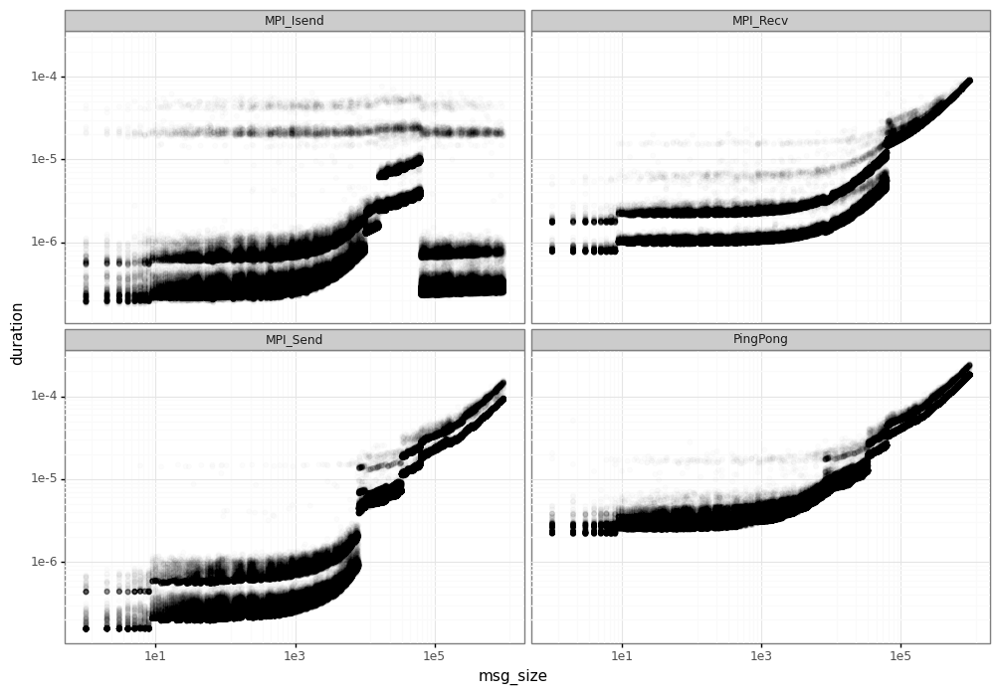

In [4]:
from plotnine import *
import plotnine
plotnine.options.figure_size = (12, 8)
tmp = pandas.concat([df_send, df_isend, df_recv, df_pingpong])
plot = ggplot(tmp, aes(x='msg_size', y='duration')) + geom_point(alpha=0.01) + scale_x_log10() + scale_y_log10() + facet_wrap('~op') + theme_bw()
plot.save('plot_op_raw.png')
print(plot)

## MPI Async/Sync modes: Identifying threshold

MPI communications can operate in different modes (asynchronous/synchronous), depending on the message size of your communication. In asynchronous mode, the MPI_Send will return immediately  while in synchronous it'll wait for respective MPI_Recv starts before returning. See Section [2.2 SimGrid/SMPI](https://tel.archives-ouvertes.fr/tel-03328956/document) for more details.

The first step is identifying the message size from which MPI starts operating in synchronous mode. This is important to determine which dataset to use in further tests (individual MPI_Send/MPI_Recv or PingPong operations).

In this example, we set the threshold to 63305, because it's the data available in our tests and matches the output of the segmentation tool.

However note that the real threshold for this platform is 64000. To be able to identify it, another study would be necessary and the adjustment of the breakpoints needs to be made. We refer to the Section [5.3.2 Finding semantic breakpoints](https://tel.archives-ouvertes.fr/tel-03328956/document) for more details.

External link: Tom Cornebize's Phd Thesis: https://tel.archives-ouvertes.fr/tel-03328956/document

In [5]:
threshold = 63305

## Segmentation

The first step for segmentation is removing the noise by averaging the duration for each message size.

/usr/local/lib/python3.9/dist-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 12 x 8 in image.
/usr/local/lib/python3.9/dist-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: plot_op_average.png


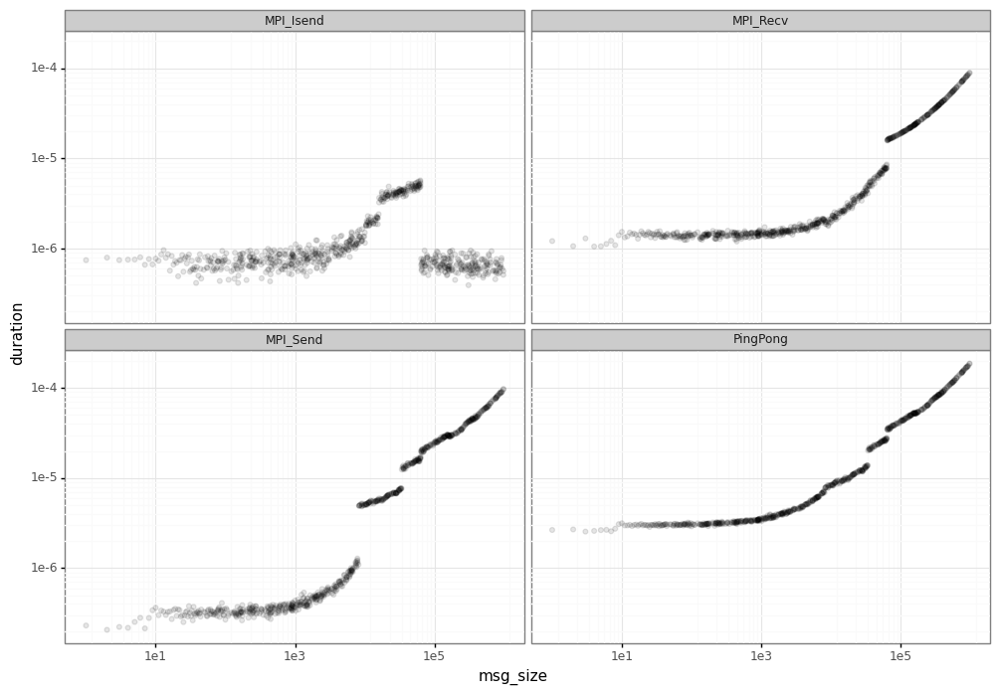

In [6]:
tmp = pandas.concat([df_send, df_isend, df_recv, df_pingpong])
tmp = tmp.groupby(['msg_size', 'op']).mean().reset_index()
plot = ggplot(tmp, aes(x='msg_size', y='duration')) + geom_point(alpha=0.1) + scale_x_log10() + scale_y_log10() + facet_wrap('~op') + theme_bw()
plot.save('plot_op_average.png')
print(plot)

Visually, you can already identify some of the segments (e.g. around 1e5 for MPI_Isend).
However, let's use a tool that makes this job and find the correct vertical lines which divide each segment.

Import pycewise library that will be used to segment communications in groups.

In [7]:
import pycewise
import numpy

### MPI_Send

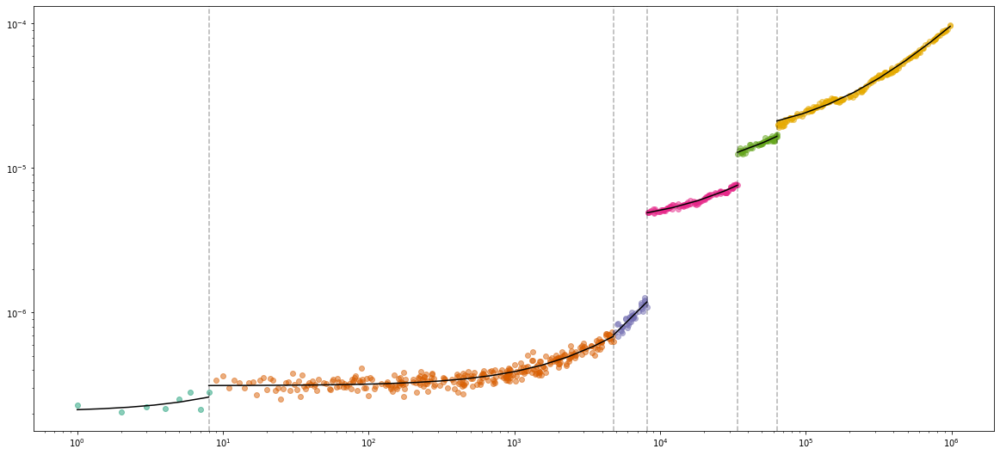

In [8]:
df_agg = df_send.groupby('msg_size').mean().reset_index()
reg_send = pycewise.compute_regression(df_agg['msg_size'], df_agg['duration'], mode='log')
reg_send.plot_dataset(log=True)

Looking the results.

In [9]:
reg_send_df = reg_send.to_pandas()
reg_send_df

,min_x,max_x,intercept,coefficient,RSS,MSE,RSSlog,weighted_RSS,statsmodels_intercept,statsmodels_coefficient
0,-inf,8.0,2.064276e-07,6.785879e-09,3.984167e-15,4.980209e-16,0.068376,4.436866e-16,2.064663e-07,7.047881e-09
1,8.0,4778.0,3.126291e-07,7.794590e-11,3.118971e-13,9.901496e-16,2.053073,8.936655e-17,3.126459e-07,7.927045e-11
2,4778.0,8133.0,7.346840e-40,1.458088e-10,1.302755e-13,3.101798e-15,0.148719,3.224656e-21,-3.338367e-08,1.512429e-10
3,8133.0,33956.0,4.052195e-06,1.042737e-10,1.840001e-12,1.786408e-14,0.051036,7.126560e-21,4.052195e-06,1.044001e-10
4,33956.0,63305.0,8.556209e-06,1.262608e-10,9.283729e-12,1.785332e-13,0.042916,4.239148e-21,8.556209e-06,1.263659e-10
5,63305.0,inf,1.603208e-05,8.109831e-11,2.459465e-10,1.205620e-12,0.235232,1.240899e-20,1.603208e-05,8.107116e-11


Remove rows above the threshold limit. In this case we pass we pass to synchronous mode and will use the PingPong results.

In [10]:
reg_send_df = reg_send_df.drop(reg_send_df[reg_send_df.min_x >= threshold].index)
reg_send_df

,min_x,max_x,intercept,coefficient,RSS,MSE,RSSlog,weighted_RSS,statsmodels_intercept,statsmodels_coefficient
0,-inf,8.0,2.064276e-07,6.785879e-09,3.984167e-15,4.980209e-16,0.068376,4.436866e-16,2.064663e-07,7.047881e-09
1,8.0,4778.0,3.126291e-07,7.794590e-11,3.118971e-13,9.901496e-16,2.053073,8.936655e-17,3.126459e-07,7.927045e-11
2,4778.0,8133.0,7.346840e-40,1.458088e-10,1.302755e-13,3.101798e-15,0.148719,3.224656e-21,-3.338367e-08,1.512429e-10
3,8133.0,33956.0,4.052195e-06,1.042737e-10,1.840001e-12,1.786408e-14,0.051036,7.126560e-21,4.052195e-06,1.044001e-10
4,33956.0,63305.0,8.556209e-06,1.262608e-10,9.283729e-12,1.785332e-13,0.042916,4.239148e-21,8.556209e-06,1.263659e-10


### MPI_Isend

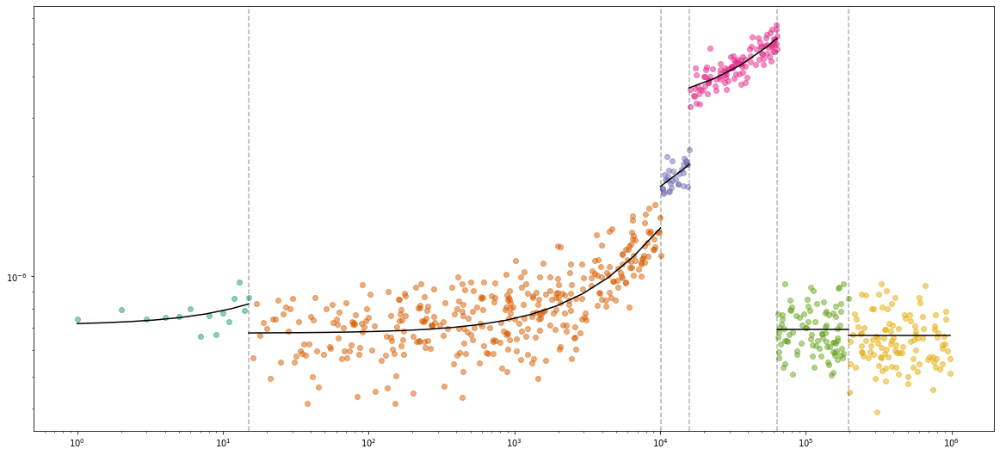

In [11]:
df_agg = df_isend.groupby('msg_size').mean().reset_index()
reg_isend = pycewise.compute_regression(df_agg['msg_size'], df_agg['duration'], mode='log')
reg_isend.plot_dataset(log=True)

Looking the results.

In [12]:
reg_isend_df = reg_isend.to_pandas()
reg_isend_df

,min_x,max_x,intercept,coefficient,RSS,MSE,RSSlog,weighted_RSS,statsmodels_intercept,statsmodels_coefficient
0,-inf,15.0,7.140545e-07,7.492430e-09,6.303000e-14,4.202000e-15,0.102732,2.150331e-15,7.140857e-07,7.918893e-09
1,15.0,10079.0,6.751043e-07,7.202421e-11,7.115027e-12,1.954678e-14,11.185148,6.666098e-16,6.874325e-07,7.180356e-11
2,10079.0,15831.0,1.328510e-06,5.344318e-11,6.227978e-13,1.946243e-14,0.149617,3.947812e-21,1.328510e-06,5.381846e-11
3,15831.0,63305.0,3.191591e-06,3.185382e-11,9.044002e-12,8.297250e-14,0.478809,1.101285e-20,3.191591e-06,3.206163e-11
4,63305.0,196988.0,6.929840e-07,3.503246e-46,1.098566e-12,1.194094e-14,2.240321,9.523349e-23,6.929840e-07,-1.421397e-14
5,196988.0,inf,6.661893e-07,7.006492e-46,1.396192e-12,1.246600e-14,3.446781,1.153646e-23,6.661893e-07,-3.948743e-14


### MPI_Recv

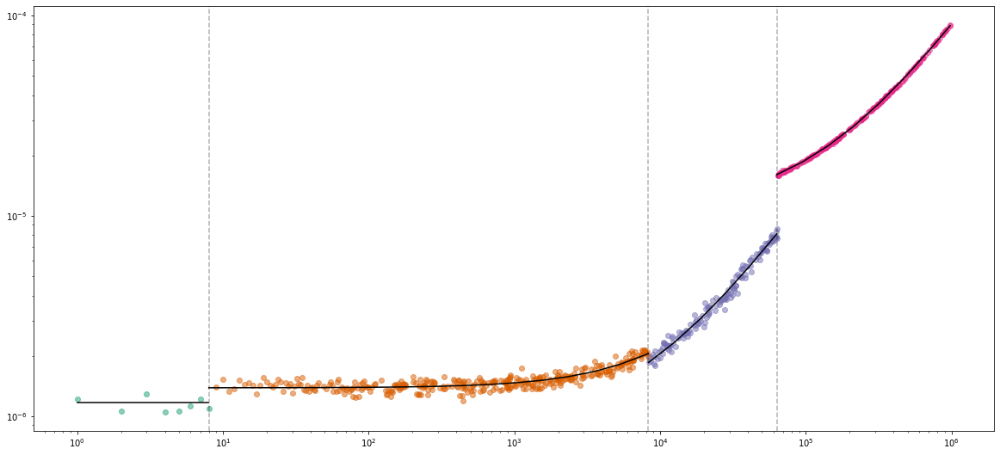

In [13]:
df_agg = df_recv.groupby('msg_size').mean().reset_index()
reg_recv = pycewise.compute_regression(df_agg['msg_size'], df_agg['duration'], mode='log')
reg_recv.plot_dataset(log=True)

Looking the results.

In [14]:
reg_recv_df = reg_recv.to_pandas()
reg_recv_df

,min_x,max_x,intercept,coefficient,RSS,MSE,RSSlog,weighted_RSS,statsmodels_intercept,statsmodels_coefficient
0,-inf,8.0,1.168595e-06,9.183550e-41,5.613748e-14,7.017185e-15,0.049335,7.798068e-15,1.169807e-06,-6.738429e-09
1,8.0,8319.0,1.384813e-06,8.063524e-11,2.195685e-12,6.116114e-15,0.952213,7.174899e-16,1.384719e-06,8.193791e-11
2,8319.0,63305.0,9.005121e-07,1.141521e-10,7.967418e-12,5.207463e-14,0.466268,1.230864e-20,9.005121e-07,1.143139e-10
3,63305.0,inf,1.101944e-05,7.947166e-11,7.212706e-12,3.535640e-14,0.007425,2.320690e-22,1.101944e-05,7.945817e-11


Remove rows above the threshold limit. In this case we pass we pass to synchronous mode and will use the PingPong results.

In [15]:
reg_recv_df = reg_recv_df.drop(reg_recv_df[reg_recv_df.min_x >= threshold].index)
reg_recv_df

,min_x,max_x,intercept,coefficient,RSS,MSE,RSSlog,weighted_RSS,statsmodels_intercept,statsmodels_coefficient
0,-inf,8.0,1.168595e-06,9.183550e-41,5.613748e-14,7.017185e-15,0.049335,7.798068e-15,1.169807e-06,-6.738429e-09
1,8.0,8319.0,1.384813e-06,8.063524e-11,2.195685e-12,6.116114e-15,0.952213,7.174899e-16,1.384719e-06,8.193791e-11
2,8319.0,63305.0,9.005121e-07,1.141521e-10,7.967418e-12,5.207463e-14,0.466268,1.230864e-20,9.005121e-07,1.143139e-10


### MPI_Ping-pong

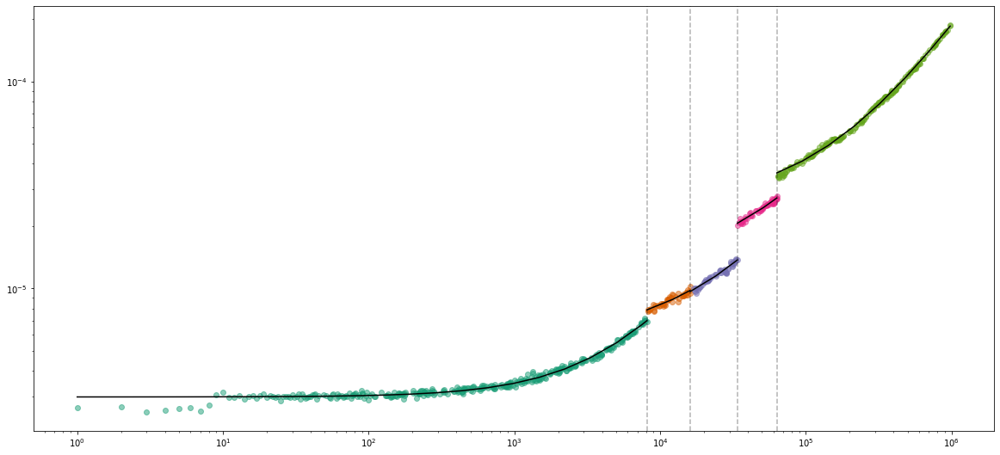

In [16]:
df_agg = df_pingpong.groupby('msg_size').mean().reset_index()
reg_pingpong = pycewise.compute_regression(df_agg['msg_size'], df_agg['duration'], mode='log')
reg_pingpong.plot_dataset(log=True)

Looking the results.

In [17]:
reg_pingpong_df = reg_pingpong.to_pandas()
reg_pingpong_df

,min_x,max_x,intercept,coefficient,RSS,MSE,RSSlog,weighted_RSS,statsmodels_intercept,statsmodels_coefficient
0,-inf,8133.0,0.000003,4.919826e-10,3.449175e-12,9.449794e-15,0.292424,1.866439e-13,0.000003,4.919890e-10
1,8133.0,16076.0,0.000006,2.388716e-10,2.461446e-12,5.128012e-14,0.031005,1.717569e-20,0.000006,2.390554e-10
2,16076.0,33956.0,0.000006,2.275817e-10,3.845740e-12,6.992255e-14,0.028112,6.392406e-21,0.000006,2.276864e-10
3,33956.0,63305.0,0.000013,2.274177e-10,1.044030e-11,2.007751e-13,0.018121,4.770819e-21,0.000013,2.274844e-10
4,63305.0,inf,0.000026,1.621952e-10,2.638767e-10,1.293513e-12,0.082006,1.396413e-20,0.000026,1.621411e-10


Removing lines smaller than threshold.

In the ping-pong case, we are interested only in the synchronous mode.

In [18]:
reg_pingpong_df = reg_pingpong_df.drop(reg_pingpong_df[reg_pingpong_df.min_x < threshold].index)
reg_pingpong_df

,min_x,max_x,intercept,coefficient,RSS,MSE,RSSlog,weighted_RSS,statsmodels_intercept,statsmodels_coefficient
4,63305.0,inf,0.000026,1.621952e-10,2.638767e-10,1.293513e-12,0.082006,1.396413e-20,0.000026,1.621411e-10


Setting the base bandwidth and latency for our platform.

These are reference numbers to calculate the network factors to apply in SimGrid models.

To obtain similar timing in SimGrid simulations, your platform must use these values when describing the links.

Specifically in this case, the hosts in dahu are interconnected through a single link with this bandwidth and latency.

In [19]:
bandwidth_base = (1.0/reg_pingpong_df.iloc[0]["coefficient"])*2.0
latency_base = reg_pingpong_df.iloc[0]['intercept']/2.0
print("Bandwidth: %e" % bandwidth_base)
print("Latency: %e" % latency_base)

Bandwidth: 1.233082e+10
Latency: 1.292490e-05


## Clustering

This plot shows the initial data with the different segments found by pycewise.

/usr/local/lib/python3.9/dist-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 12 x 8 in image.
/usr/local/lib/python3.9/dist-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: plot_op_segmented.png
/usr/lib/python3/dist-packages/pandas/core/series.py:726: RuntimeWarning: invalid value encountered in log10
/usr/local/lib/python3.9/dist-packages/plotnine/layer.py:401: PlotnineWarning: geom_vline : Removed 4 rows containing missing values.
/usr/lib/python3/dist-packages/pandas/core/series.py:726: RuntimeWarning: invalid value encountered in log10
/usr/local/lib/python3.9/dist-packages/plotnine/layer.py:401: PlotnineWarning: geom_vline : Removed 4 rows containing missing values.


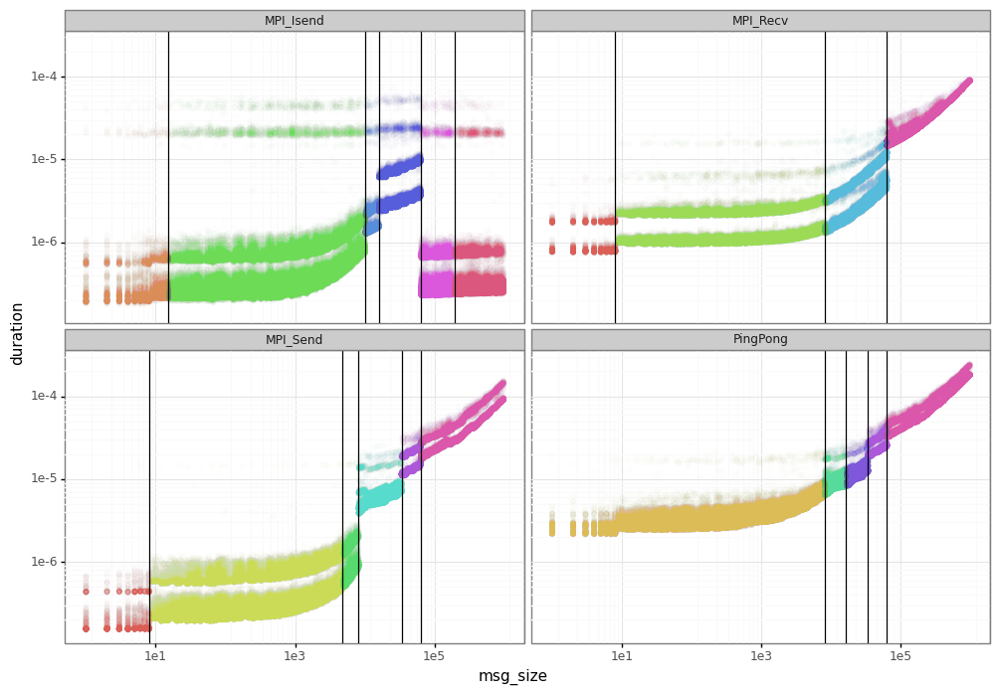

In [20]:
segments = pandas.DataFrame()
tmp = pandas.DataFrame()

#grouping data by segments found by pycewise
for (name, df, reg) in [('MPI_Send', df_send, reg_send), ('MPI_Isend', df_isend, reg_isend), ('MPI_Recv', df_recv, reg_recv), ('PingPong', df_pingpong, reg_pingpong)]:
    tmp2 = df
    seg = [-numpy.inf] + [max for ((min,max),_) in reg.flatify().segments]
    tmp2['group'] = pandas.cut(tmp2['msg_size'], seg)
    segments = pandas.concat([segments, pandas.DataFrame(dict(op=name, seg=seg))])
    tmp = pandas.concat([tmp, tmp2])

plot = ggplot(tmp, aes(x='msg_size', y='duration', color='group')) + geom_point(alpha=0.01) + geom_vline(segments, aes(xintercept='seg')) + scale_x_log10() + scale_y_log10() + facet_wrap('~op') + theme_bw() + scale_color_discrete(guide=False)
plot.save('plot_op_segmented.png')
print(plot)

The linear models are sufficient to emulate the average duration of each operation.

However, you may be interested in a more realistic model capable of generating the noise and variability for each message size.

For that, it's necessary the clustering phase to create specific models for the noise inside each segment.

We use 2 different tools to create the noise models for the MPI communications: **ckmeans** and **dhist**.

You probably want to try both and see which one is better giving your environment. Note that a manual tunning of the results may be needed.

The output of the clustering phase is injected in SimGrid. To make this easier, we export the different models using JSON files.

### Ckmeans.1d.dp

The noise is modeled here by a mixture of normal distributions. For each segmented found by pycewise, we have a set of normal distributions (with their respective probabilities) that describes the noise.

Ckmeans is used to aggregate the points together. One mixture of normal distributions is created for each cluster.

#### MPI_Send

In [21]:
import tempfile

reg_send_df['intercept_file'] = [tempfile.mkstemp()[1] for _ in range(len(reg_send_df))]
reg_send_df

,min_x,max_x,intercept,coefficient,RSS,MSE,RSSlog,weighted_RSS,statsmodels_intercept,statsmodels_coefficient,intercept_file
0,-inf,8.0,2.064276e-07,6.785879e-09,3.984167e-15,4.980209e-16,0.068376,4.436866e-16,2.064663e-07,7.047881e-09,/tmp/tmpw_217vxg
1,8.0,4778.0,3.126291e-07,7.794590e-11,3.118971e-13,9.901496e-16,2.053073,8.936655e-17,3.126459e-07,7.927045e-11,/tmp/tmpc9y15f5a
2,4778.0,8133.0,7.346840e-40,1.458088e-10,1.302755e-13,3.101798e-15,0.148719,3.224656e-21,-3.338367e-08,1.512429e-10,/tmp/tmpstn1bnoe
3,8133.0,33956.0,4.052195e-06,1.042737e-10,1.840001e-12,1.786408e-14,0.051036,7.126560e-21,4.052195e-06,1.044001e-10,/tmp/tmp8bki15wt
4,33956.0,63305.0,8.556209e-06,1.262608e-10,9.283729e-12,1.785332e-13,0.042916,4.239148e-21,8.556209e-06,1.263659e-10,/tmp/tmp1lxjmwkt


In [22]:
import papermill as pm

for i, row in reg_send_df.iterrows():
    df = df_send[(df_send.msg_size > row["min_x"]) & (df_send.msg_size < row["max_x"])]
    pm.execute_notebook(
       'clustering_ckmeans.ipynb',
       'ckmeans_%s_%s_%s.ipynb' % ("MPI_Send", row["min_x"], row["max_x"]),
       parameters=dict(
           df_str=df.to_csv(),
           metric="duration",
           coeff_col_name="msg_size",
           output_file=row["intercept_file"]
       )
    )

Executing:   0%|          | 0/30 [00:00<?, ?cell/s]


Execution halted


Executing:   0%|          | 0/30 [00:00<?, ?cell/s]


Execution halted


Executing:   0%|          | 0/30 [00:00<?, ?cell/s]


Execution halted


Executing:   0%|          | 0/30 [00:00<?, ?cell/s]


Execution halted


Executing:   0%|          | 0/30 [00:00<?, ?cell/s]


Execution halted


##### Extracting models

In [23]:
send_models = pandas.DataFrame()
for i, row in reg_send_df.iterrows():
    df = pandas.read_csv(row["intercept_file"])
    df["min_x"] = row["min_x"]
    df["max_x"] = row["max_x"]
    send_models = pandas.concat([send_models, df])
send_models.replace([-numpy.inf], 0, inplace=True)
send_models = send_models.drop(columns="Unnamed: 0").reset_index(drop=True)
send_models

,mean,sd,prob,coefficient,min_x,max_x
0,1.559763e-07,4.078012e-09,0.619034,3.333333e-10,0.0,8.0
1,1.916024e-07,1.094938e-08,0.105173,3.333333e-10,0.0,8.0
2,2.309763e-07,1.245767e-08,0.060303,3.333333e-10,0.0,8.0
3,2.793051e-07,2.045145e-08,0.037153,3.333333e-10,0.0,8.0
4,4.375881e-07,1.105646e-08,0.129751,3.333333e-10,0.0,8.0
5,5.104603e-07,2.172848e-08,0.018005,3.333333e-10,0.0,8.0
6,5.937901e-07,2.779261e-08,0.015433,3.333333e-10,0.0,8.0
7,7.054843e-07,4.410606e-08,0.015147,3.333333e-10,0.0,8.0
8,2.152272e-07,1.777699e-08,0.654325,5.703924e-11,8.0,4778.0
9,3.124260e-07,4.079135e-08,0.144962,5.703924e-11,8.0,4778.0


In [24]:
send_models_seg = {"bandwidth_base": bandwidth_base, "latency_base" : latency_base, "seg": send_models.to_dict(orient="records")}
send_models_seg

{'bandwidth_base': 12330818795.43382,
 'latency_base': 1.2924904864614219e-05,
 'seg': [{'mean': 1.55976300400123e-07,
   'sd': 4.0780117294624e-09,
   'prob': 0.619034009717062,
   'coefficient': 3.33333333333337e-10,
   'min_x': 0.0,
   'max_x': 8.0},
  {'mean': 1.91602355072464e-07,
   'sd': 1.09493826405434e-08,
   'prob': 0.105172906544727,
   'coefficient': 3.33333333333337e-10,
   'min_x': 0.0,
   'max_x': 8.0},
  {'mean': 2.3097630331753603e-07,
   'sd': 1.24576729643804e-08,
   'prob': 0.0603029436981995,
   'coefficient': 3.33333333333337e-10,
   'min_x': 0.0,
   'max_x': 8.0},
  {'mean': 2.79305128205128e-07,
   'sd': 2.0451452341310097e-08,
   'prob': 0.0371534724206916,
   'coefficient': 3.33333333333337e-10,
   'min_x': 0.0,
   'max_x': 8.0},
  {'mean': 4.3758810572687206e-07,
   'sd': 1.1056456254386298e-08,
   'prob': 0.129751357530723,
   'coefficient': 3.33333333333337e-10,
   'min_x': 0.0,
   'max_x': 8.0},
  {'mean': 5.104603174603171e-07,
   'sd': 2.1728483244971e-

Saving to JSON file.

In [25]:
import json

with open('send_ckmeans.json', 'w') as fout:
    json.dump(send_models_seg, indent=2, fp=fout)

#### MPI_ISend

In [26]:
import tempfile

reg_isend_df['intercept_file'] = [tempfile.mkstemp()[1] for _ in range(len(reg_isend_df))]
reg_isend_df

,min_x,max_x,intercept,coefficient,RSS,MSE,RSSlog,weighted_RSS,statsmodels_intercept,statsmodels_coefficient,intercept_file
0,-inf,15.0,7.140545e-07,7.492430e-09,6.303000e-14,4.202000e-15,0.102732,2.150331e-15,7.140857e-07,7.918893e-09,/tmp/tmpvghs28v_
1,15.0,10079.0,6.751043e-07,7.202421e-11,7.115027e-12,1.954678e-14,11.185148,6.666098e-16,6.874325e-07,7.180356e-11,/tmp/tmpogirztt1
2,10079.0,15831.0,1.328510e-06,5.344318e-11,6.227978e-13,1.946243e-14,0.149617,3.947812e-21,1.328510e-06,5.381846e-11,/tmp/tmpxe_syrk3
3,15831.0,63305.0,3.191591e-06,3.185382e-11,9.044002e-12,8.297250e-14,0.478809,1.101285e-20,3.191591e-06,3.206163e-11,/tmp/tmpru_de20o
4,63305.0,196988.0,6.929840e-07,3.503246e-46,1.098566e-12,1.194094e-14,2.240321,9.523349e-23,6.929840e-07,-1.421397e-14,/tmp/tmpgu0yhslw
5,196988.0,inf,6.661893e-07,7.006492e-46,1.396192e-12,1.246600e-14,3.446781,1.153646e-23,6.661893e-07,-3.948743e-14,/tmp/tmp27zucgmd


In [27]:
import papermill as pm

for i, row in reg_isend_df.iterrows():
    df = df_isend[(df_isend.msg_size > row["min_x"]) & (df_isend.msg_size < row["max_x"])]
    pm.execute_notebook(
       'clustering_ckmeans.ipynb',
       'ckmeans_%s_%s_%s.ipynb' % ("MPI_Isend", row["min_x"], row["max_x"]),
       parameters=dict(
           df_str=df.to_csv(),
           metric="duration",
           coeff_col_name="msg_size",
           output_file=row["intercept_file"]
       )
    )

Executing:   0%|          | 0/30 [00:00<?, ?cell/s]


Execution halted


Executing:   0%|          | 0/30 [00:00<?, ?cell/s]

Executing:   0%|          | 0/30 [00:00<?, ?cell/s]


Execution halted


Executing:   0%|          | 0/30 [00:00<?, ?cell/s]


Execution halted


Executing:   0%|          | 0/30 [00:00<?, ?cell/s]


Execution halted


Executing:   0%|          | 0/30 [00:00<?, ?cell/s]


Execution halted


##### Extracting models

In [28]:
isend_models = pandas.DataFrame()
for i, row in reg_isend_df.iterrows():
    df = pandas.read_csv(row["intercept_file"])
    df["min_x"] = row["min_x"]
    df["max_x"] = row["max_x"]
    isend_models = pandas.concat([isend_models, df])
isend_models.replace([-numpy.inf], 0, inplace=True)
isend_models.replace([numpy.inf], numpy.finfo('f').max, inplace=True)
isend_models = isend_models.drop(columns="Unnamed: 0").reset_index(drop=True)
isend_models

,mean,sd,prob,coefficient,min_x,max_x
0,2.286870e-07,5.226028e-08,0.766286,2.333333e-09,0.0,1.500000e+01
1,6.366702e-07,1.460424e-07,0.216429,2.333333e-09,0.0,1.500000e+01
2,2.021619e-05,1.377915e-06,0.010429,2.333333e-09,0.0,1.500000e+01
3,2.367753e-05,1.572203e-06,0.003571,2.333333e-09,0.0,1.500000e+01
4,4.210063e-05,2.103873e-06,0.002429,2.333333e-09,0.0,1.500000e+01
5,5.021994e-05,2.523559e-06,0.000857,2.333333e-09,0.0,1.500000e+01
6,2.530484e-07,5.128661e-08,0.769300,4.987685e-11,15.0,1.007900e+04
7,6.942097e-07,9.000397e-08,0.167416,4.987685e-11,15.0,1.007900e+04
8,1.150675e-06,2.268920e-07,0.049102,4.987685e-11,15.0,1.007900e+04
9,1.361383e-05,2.345747e-06,0.000331,4.987685e-11,15.0,1.007900e+04


In [29]:
isend_models_seg = {"bandwidth_base": bandwidth_base, "latency_base" : latency_base, "seg": isend_models.to_dict(orient="records")}
isend_models_seg

{'bandwidth_base': 12330818795.43382,
 'latency_base': 1.2924904864614219e-05,
 'seg': [{'mean': 2.28686987322893e-07,
   'sd': 5.22602768224775e-08,
   'prob': 0.7662857142857141,
   'coefficient': 2.3333333333333302e-09,
   'min_x': 0.0,
   'max_x': 15.0},
  {'mean': 6.36670187018702e-07,
   'sd': 1.46042425265142e-07,
   'prob': 0.216428571428571,
   'coefficient': 2.3333333333333302e-09,
   'min_x': 0.0,
   'max_x': 15.0},
  {'mean': 2.02161917808219e-05,
   'sd': 1.37791525402587e-06,
   'prob': 0.0104285714285714,
   'coefficient': 2.3333333333333302e-09,
   'min_x': 0.0,
   'max_x': 15.0},
  {'mean': 2.36775333333333e-05,
   'sd': 1.57220316635488e-06,
   'prob': 0.0035714285714285704,
   'coefficient': 2.3333333333333302e-09,
   'min_x': 0.0,
   'max_x': 15.0},
  {'mean': 4.2100627450980394e-05,
   'sd': 2.10387284378369e-06,
   'prob': 0.00242857142857143,
   'coefficient': 2.3333333333333302e-09,
   'min_x': 0.0,
   'max_x': 15.0},
  {'mean': 5.02199444444444e-05,
   'sd': 2.

Saving to JSON file

In [30]:
import json

with open('isend_ckmeans.json', 'w') as fout:
    json.dump(isend_models_seg, indent=2, fp=fout)

#### MPI_Recv

In [31]:
import tempfile

reg_recv_df['intercept_file'] = [tempfile.mkstemp()[1] for _ in range(len(reg_recv_df))]
reg_recv_df

,min_x,max_x,intercept,coefficient,RSS,MSE,RSSlog,weighted_RSS,statsmodels_intercept,statsmodels_coefficient,intercept_file
0,-inf,8.0,1.168595e-06,9.183550e-41,5.613748e-14,7.017185e-15,0.049335,7.798068e-15,1.169807e-06,-6.738429e-09,/tmp/tmp608253ed
1,8.0,8319.0,1.384813e-06,8.063524e-11,2.195685e-12,6.116114e-15,0.952213,7.174899e-16,1.384719e-06,8.193791e-11,/tmp/tmpct4ze9er
2,8319.0,63305.0,9.005121e-07,1.141521e-10,7.967418e-12,5.207463e-14,0.466268,1.230864e-20,9.005121e-07,1.143139e-10,/tmp/tmp1lmc8lm2


In [32]:
import papermill as pm

for i, row in reg_recv_df.iterrows():
    df = df_recv[(df_recv.msg_size > row["min_x"]) & (df_recv.msg_size < row["max_x"])]
    pm.execute_notebook(
       'clustering_ckmeans.ipynb',
       'ckmeans_%s_%s_%s.ipynb' % ("MPI_Recv", row["min_x"], row["max_x"]),
       parameters=dict(
           df_str=df.to_csv(),
           metric="duration",
           coeff_col_name="msg_size",
           output_file=row["intercept_file"]
       )
    )

Executing:   0%|          | 0/30 [00:00<?, ?cell/s]


Execution halted


Executing:   0%|          | 0/30 [00:00<?, ?cell/s]

Executing:   0%|          | 0/30 [00:00<?, ?cell/s]


Execution halted


##### Extracting models

In [33]:
recv_models = pandas.DataFrame()
for i, row in reg_recv_df.iterrows():
    df = pandas.read_csv(row["intercept_file"])
    df["min_x"] = row["min_x"]
    df["max_x"] = row["max_x"]
    recv_models = pandas.concat([recv_models, df])
recv_models.replace([-numpy.inf], 0, inplace=True)
recv_models = recv_models.drop(columns="Unnamed: 0").reset_index(drop=True)
recv_models

,mean,sd,prob,coefficient,min_x,max_x
0,7.854667e-07,2.078796e-08,0.579143,3.333333e-10,0.0,8.0
1,8.963110e-07,5.325405e-08,0.102286,3.333333e-10,0.0,8.0
2,1.774207e-06,4.584075e-08,0.266571,3.333333e-10,0.0,8.0
3,2.021219e-06,9.379408e-08,0.040857,3.333333e-10,0.0,8.0
4,2.662565e-06,3.005444e-07,0.006571,3.333333e-10,0.0,8.0
5,5.615688e-06,3.982099e-07,0.004571,3.333333e-10,0.0,8.0
6,1.001451e-06,2.726898e-08,0.552346,5.168776e-11,8.0,8319.0
7,1.109214e-06,5.077507e-08,0.159257,5.168776e-11,8.0,8319.0
8,2.229532e-06,6.328803e-08,0.169983,5.168776e-11,8.0,8319.0
9,2.462767e-06,8.301583e-08,0.077899,5.168776e-11,8.0,8319.0


In [34]:
recv_models_seg = {"bandwidth_base": bandwidth_base, "latency_base" : latency_base, "seg": recv_models.to_dict(orient="records")}
recv_models_seg

{'bandwidth_base': 12330818795.43382,
 'latency_base': 1.2924904864614219e-05,
 'seg': [{'mean': 7.854666995559941e-07,
   'sd': 2.0787955872453302e-08,
   'prob': 0.5791428571428571,
   'coefficient': 3.33333333333288e-10,
   'min_x': 0.0,
   'max_x': 8.0},
  {'mean': 8.963109869646179e-07,
   'sd': 5.32540505220039e-08,
   'prob': 0.10228571428571401,
   'coefficient': 3.33333333333288e-10,
   'min_x': 0.0,
   'max_x': 8.0},
  {'mean': 1.77420650232226e-06,
   'sd': 4.5840752325771294e-08,
   'prob': 0.266571428571429,
   'coefficient': 3.33333333333288e-10,
   'min_x': 0.0,
   'max_x': 8.0},
  {'mean': 2.02121911421911e-06,
   'sd': 9.37940849286242e-08,
   'prob': 0.0408571428571429,
   'coefficient': 3.33333333333288e-10,
   'min_x': 0.0,
   'max_x': 8.0},
  {'mean': 2.6625652173912996e-06,
   'sd': 3.00544445943862e-07,
   'prob': 0.00657142857142857,
   'coefficient': 3.33333333333288e-10,
   'min_x': 0.0,
   'max_x': 8.0},
  {'mean': 5.6156875e-06,
   'sd': 3.98209873359188e-07

Saving to JSON file

In [35]:
import json

with open('recv_ckmeans.json', 'w') as fout:
    json.dump(recv_models_seg, indent=2, fp=fout)

#### MPI_Ping-pong

In [36]:
import tempfile

reg_pingpong_df['intercept_file'] = [tempfile.mkstemp()[1] for _ in range(len(reg_pingpong_df))]
reg_pingpong_df

,min_x,max_x,intercept,coefficient,RSS,MSE,RSSlog,weighted_RSS,statsmodels_intercept,statsmodels_coefficient,intercept_file
4,63305.0,inf,0.000026,1.621952e-10,2.638767e-10,1.293513e-12,0.082006,1.396413e-20,0.000026,1.621411e-10,/tmp/tmpfh8d4si6


In [37]:
import papermill as pm

for i, row in reg_pingpong_df.iterrows():
    df = df_pingpong[(df_pingpong.msg_size > row["min_x"]) & (df_pingpong.msg_size < row["max_x"])]
    pm.execute_notebook(
       'clustering_ckmeans.ipynb',
       'ckmeans_%s_%s_%s.ipynb' % ("MPI_PingPong", row["min_x"], row["max_x"]),
       parameters=dict(
           df_str=df.to_csv(),
           metric="duration",
           coeff_col_name="msg_size",
           output_file=row["intercept_file"]
       )
    )

Executing:   0%|          | 0/30 [00:00<?, ?cell/s]


Execution halted


##### Extracting models

In [38]:
pingpong_models = pandas.DataFrame()
for i, row in reg_pingpong_df.iterrows():
    df = pandas.read_csv(row["intercept_file"])
    df["min_x"] = row["min_x"]
    df["max_x"] = row["max_x"]
    pingpong_models = pandas.concat([pingpong_models, df])

pingpong_models.replace([numpy.inf], numpy.finfo('f').max, inplace=True)
pingpong_models = pingpong_models.drop(columns="Unnamed: 0").reset_index(drop=True)
pingpong_models

,mean,sd,prob,coefficient,min_x,max_x
0,0.000023,6.161459e-07,0.499706,1.609926e-10,63305.0,3.402823e+38
1,0.000025,7.381383e-07,0.385196,1.609926e-10,63305.0,3.402823e+38
2,0.000038,2.366597e-06,0.073314,1.609926e-10,63305.0,3.402823e+38
3,0.000049,2.861317e-06,0.024108,1.609926e-10,63305.0,3.402823e+38
4,0.000060,3.578838e-06,0.011696,1.609926e-10,63305.0,3.402823e+38
5,0.000074,4.997581e-06,0.005980,1.609926e-10,63305.0,3.402823e+38


Ping-pong measures give us the round-trip estimated time, but we need the elapsed time in 1 direction to inject in SimGrid.

For simplicity, we just scale down the normal distributions.

However, a proper calculation may be necessary at this step.

In [39]:
pingpong_models["coefficient"] = pingpong_models["coefficient"]/2
pingpong_models["mean"] = pingpong_models["mean"]/2
pingpong_models["sd"] = pingpong_models["sd"]/numpy.sqrt(2)
pingpong_models

,mean,sd,prob,coefficient,min_x,max_x
0,0.000012,4.356809e-07,0.499706,8.049632e-11,63305.0,3.402823e+38
1,0.000013,5.219426e-07,0.385196,8.049632e-11,63305.0,3.402823e+38
2,0.000019,1.673437e-06,0.073314,8.049632e-11,63305.0,3.402823e+38
3,0.000025,2.023256e-06,0.024108,8.049632e-11,63305.0,3.402823e+38
4,0.000030,2.530620e-06,0.011696,8.049632e-11,63305.0,3.402823e+38
5,0.000037,3.533823e-06,0.005980,8.049632e-11,63305.0,3.402823e+38


In [40]:
pingpong_models_seg = {"bandwidth_base": bandwidth_base, "latency_base" : latency_base, "seg": pingpong_models.to_dict(orient="records")}
pingpong_models_seg

{'bandwidth_base': 12330818795.43382,
 'latency_base': 1.2924904864614219e-05,
 'seg': [{'mean': 1.1503128856516448e-05,
   'sd': 4.3568091437319533e-07,
   'prob': 0.49970588235294106,
   'coefficient': 8.04963230919345e-11,
   'min_x': 63305.0,
   'max_x': 3.4028234663852886e+38},
  {'mean': 1.2504551284320949e-05,
   'sd': 5.219425841751762e-07,
   'prob': 0.385196078431373,
   'coefficient': 8.04963230919345e-11,
   'min_x': 63305.0,
   'max_x': 3.4028234663852886e+38},
  {'mean': 1.879472592512515e-05,
   'sd': 1.6734369316865939e-06,
   'prob': 0.0733137254901961,
   'coefficient': 8.04963230919345e-11,
   'min_x': 63305.0,
   'max_x': 3.4028234663852886e+38},
  {'mean': 2.451754075327485e-05,
   'sd': 2.0232563328989863e-06,
   'prob': 0.0241078431372549,
   'coefficient': 8.04963230919345e-11,
   'min_x': 63305.0,
   'max_x': 3.4028234663852886e+38},
  {'mean': 3.004149952883e-05,
   'sd': 2.5306204869242285e-06,
   'prob': 0.0116960784313725,
   'coefficient': 8.04963230919345

Saving to JSON file

In [41]:
import json

with open('pingpong_ckmeans.json', 'w') as fout:
    json.dump(pingpong_models_seg, indent=2, fp=fout)

### Dhist

Alternatively, we can model the noise using non-uniform histograms.

Diagonally cut histograms are used in this case, one histogram for each segment.

The noise is later sampled following these histograms.

Note: For better results, we had to apply a log function on the elapsed time before running the dhist algorithm. However, it's not clear why this gives better results.

#### MPI_Send

In [42]:
import tempfile

reg_send_df['xbr_file'] = [tempfile.mkstemp()[1] for _ in range(len(reg_send_df))]
reg_send_df['height_file'] = [tempfile.mkstemp()[1] for _ in range(len(reg_send_df))]
reg_send_df

,min_x,max_x,intercept,coefficient,RSS,MSE,RSSlog,weighted_RSS,statsmodels_intercept,statsmodels_coefficient,intercept_file,xbr_file,height_file
0,-inf,8.0,2.064276e-07,6.785879e-09,3.984167e-15,4.980209e-16,0.068376,4.436866e-16,2.064663e-07,7.047881e-09,/tmp/tmpw_217vxg,/tmp/tmpy4ppinfi,/tmp/tmp9pm_zva0
1,8.0,4778.0,3.126291e-07,7.794590e-11,3.118971e-13,9.901496e-16,2.053073,8.936655e-17,3.126459e-07,7.927045e-11,/tmp/tmpc9y15f5a,/tmp/tmpe4oxjo2p,/tmp/tmpzidubr6a
2,4778.0,8133.0,7.346840e-40,1.458088e-10,1.302755e-13,3.101798e-15,0.148719,3.224656e-21,-3.338367e-08,1.512429e-10,/tmp/tmpstn1bnoe,/tmp/tmpz7q6jjmc,/tmp/tmp3akyk5i2
3,8133.0,33956.0,4.052195e-06,1.042737e-10,1.840001e-12,1.786408e-14,0.051036,7.126560e-21,4.052195e-06,1.044001e-10,/tmp/tmp8bki15wt,/tmp/tmp4s_8bd7r,/tmp/tmp0ekgfi_j
4,33956.0,63305.0,8.556209e-06,1.262608e-10,9.283729e-12,1.785332e-13,0.042916,4.239148e-21,8.556209e-06,1.263659e-10,/tmp/tmp1lxjmwkt,/tmp/tmp6xjxwas9,/tmp/tmphr628m0x


In [43]:
import papermill as pm
log_data=True

for i, row in reg_send_df.iterrows():
    df = df_send[(df_send.msg_size > row["min_x"]) & (df_send.msg_size < row["max_x"])]
    pm.execute_notebook(
       'clustering_dhist.ipynb',
       'dhist_%s_%s_%s.ipynb' % ("MPI_Send", row["min_x"], row["max_x"]),
       parameters=dict(
           df_str=df.to_csv(),
           metric="duration",
           coeff_col_name="msg_size",
           coeff_value=row["coefficient"],
           log=log_data,
           xbr_file=row["xbr_file"],
           height_file=row["height_file"],           
       )
    )

Executing:   0%|          | 0/20 [00:00<?, ?cell/s]


Execution halted


Executing:   0%|          | 0/20 [00:00<?, ?cell/s]


Execution halted


Executing:   0%|          | 0/20 [00:00<?, ?cell/s]


Execution halted


Executing:   0%|          | 0/20 [00:00<?, ?cell/s]


Execution halted


Executing:   0%|          | 0/20 [00:00<?, ?cell/s]


Execution halted


##### Extracting models and saving to JSON file

In [44]:
import json

send_dhist = []
for i, row in reg_send_df.iterrows():
    row.replace([-numpy.inf], 0, inplace=True)
    row.replace([numpy.inf], float(numpy.finfo('f').max), inplace=True)    
    xbr = pandas.read_csv(row["xbr_file"])["xbr"].tolist()
    height = pandas.read_csv(row["height_file"])["Freq"].tolist()
    send_dhist.append({
        'log': log_data,
        'min_x': row['min_x'],
        'max_x': row['max_x'],
        'xbr': xbr,
        'height': height,
        'coeff': row['coefficient']})

send_dhist = {"bandwidth_base": bandwidth_base, "latency_base" : latency_base, "seg": send_dhist}
send_dhist

{'bandwidth_base': 12330818795.43382,
 'latency_base': 1.2924904864614219e-05,
 'seg': [{'log': True,
   'min_x': 0,
   'max_x': 8.0,
   'xbr': [-16.0645658429023,
    -15.9268919677419,
    -15.8146632295928,
    -15.7246078482634,
    -15.5145642420779,
    -15.186496760337,
    -14.731624798547301,
    -14.449043295371899,
    -13.957256712520001,
    -13.3942266773347,
    -12.8311966421495,
    -12.268166606964199,
    -11.705136571779,
    -11.1427915697892],
   'height': [4510.1353222374,
    5863.66917728068,
    7666.84320115182,
    2453.22242306672,
    1045.4995520750301,
    347.102832455122,
    1448.7645909548,
    211.473845823314,
    0.0,
    0.0,
    0.0,
    0.0,
    1.77826778305436],
   'coeff': 6.785879450666414e-09},
  {'log': True,
   'min_x': 8.0,
   'max_x': 4778.0,
   'xbr': [-16.477867515041197,
    -16.0778382774327,
    -15.7506068444978,
    -15.551570498528699,
    -15.4623780487743,
    -15.409542779523198,
    -15.348182871594501,
    -15.197827516127

In [45]:
with open('send_dhist.json', 'w') as fout:
    json.dump(send_dhist, indent=2, fp=fout)

#### MPI_Isend

In [46]:
import tempfile

reg_isend_df['xbr_file'] = [tempfile.mkstemp()[1] for _ in range(len(reg_isend_df))]
reg_isend_df['height_file'] = [tempfile.mkstemp()[1] for _ in range(len(reg_isend_df))]
reg_isend_df

,min_x,max_x,intercept,coefficient,RSS,MSE,RSSlog,weighted_RSS,statsmodels_intercept,statsmodels_coefficient,intercept_file,xbr_file,height_file
0,-inf,15.0,7.140545e-07,7.492430e-09,6.303000e-14,4.202000e-15,0.102732,2.150331e-15,7.140857e-07,7.918893e-09,/tmp/tmpvghs28v_,/tmp/tmpeg3zud2g,/tmp/tmp_8nt59rg
1,15.0,10079.0,6.751043e-07,7.202421e-11,7.115027e-12,1.954678e-14,11.185148,6.666098e-16,6.874325e-07,7.180356e-11,/tmp/tmpogirztt1,/tmp/tmpni459__y,/tmp/tmp14xhseqc
2,10079.0,15831.0,1.328510e-06,5.344318e-11,6.227978e-13,1.946243e-14,0.149617,3.947812e-21,1.328510e-06,5.381846e-11,/tmp/tmpxe_syrk3,/tmp/tmpzr2zrfay,/tmp/tmp9fti89c4
3,15831.0,63305.0,3.191591e-06,3.185382e-11,9.044002e-12,8.297250e-14,0.478809,1.101285e-20,3.191591e-06,3.206163e-11,/tmp/tmpru_de20o,/tmp/tmp169woas9,/tmp/tmpedkxqpd1
4,63305.0,196988.0,6.929840e-07,3.503246e-46,1.098566e-12,1.194094e-14,2.240321,9.523349e-23,6.929840e-07,-1.421397e-14,/tmp/tmpgu0yhslw,/tmp/tmpcku7y813,/tmp/tmp192j5b75
5,196988.0,inf,6.661893e-07,7.006492e-46,1.396192e-12,1.246600e-14,3.446781,1.153646e-23,6.661893e-07,-3.948743e-14,/tmp/tmp27zucgmd,/tmp/tmpns4wsy32,/tmp/tmpjv53rs3w


In [47]:
import papermill as pm
log_data=True

for i, row in reg_isend_df.iterrows():
    df = df_isend[(df_isend.msg_size > row["min_x"]) & (df_isend.msg_size < row["max_x"])]
    pm.execute_notebook(
       'clustering_dhist.ipynb',
       'dhist_%s_%s_%s.ipynb' % ("MPI_Isend", row["min_x"], row["max_x"]),
       parameters=dict(
           df_str=df.to_csv(),
           metric="duration",
           coeff_col_name="msg_size",
           coeff_value=row["coefficient"],
           log=log_data,
           xbr_file=row["xbr_file"],
           height_file=row["height_file"],           
       )
    )

Executing:   0%|          | 0/20 [00:00<?, ?cell/s]


Execution halted


Executing:   0%|          | 0/20 [00:00<?, ?cell/s]

Executing:   0%|          | 0/20 [00:00<?, ?cell/s]


Execution halted


Executing:   0%|          | 0/20 [00:00<?, ?cell/s]


Execution halted


Executing:   0%|          | 0/20 [00:00<?, ?cell/s]


Execution halted


Executing:   0%|          | 0/20 [00:00<?, ?cell/s]

##### Extracting models and saving to JSON file

In [48]:
import json

isend_dhist = []
for i, row in reg_isend_df.iterrows():
    row.replace([-numpy.inf], 0, inplace=True)
    row.replace([numpy.inf], float(numpy.finfo('f').max), inplace=True)    
    xbr = pandas.read_csv(row["xbr_file"])["xbr"].tolist()
    height = pandas.read_csv(row["height_file"])["Freq"].tolist()
    isend_dhist.append({
        'log': log_data,
        'min_x': row['min_x'],
        'max_x': row['max_x'],
        'xbr': xbr,
        'height': height,
        'coeff': row['coefficient']})
    
isend_dhist = {"bandwidth_base": bandwidth_base, "latency_base" : latency_base, "seg": isend_dhist}
isend_dhist

{'bandwidth_base': 12330818795.43382,
 'latency_base': 1.2924904864614219e-05,
 'seg': [{'log': True,
   'min_x': 0,
   'max_x': 15.0,
   'xbr': [-16.0778563894789,
    -15.784235974729999,
    -15.6447360899793,
    -15.5246851604093,
    -15.3904739041949,
    -15.162572695246801,
    -14.7505171633725,
    -14.419113116168498,
    -14.0735064411074,
    -13.426049409531501,
    -12.6914424876639,
    -11.9562591128459,
    -11.2210757380279,
    -10.5418082994066,
    -9.82045979540014],
   'height': [2608.81042844107,
    7407.605546177049,
    8888.7203085503,
    7767.86226148884,
    3861.34938093187,
    1360.3628587742098,
    2113.59808244763,
    1955.4512167665803,
    235.04726847840197,
    1.36127222631902,
    0.0,
    0.0,
    142.800897680128,
    33.271019301628606],
   'coeff': 7.49242978634595e-09},
  {'log': True,
   'min_x': 15.0,
   'max_x': 10079.0,
   'xbr': [-19.1763004685913,
    -18.5068317779429,
    -17.8374692805649,
    -17.1692749091605,
    -16.519628

In [49]:
with open('isend_dhist.json', 'w') as fout:
    json.dump(isend_dhist, indent=2, fp=fout)

#### MPI_Recv

In [50]:
import tempfile

reg_recv_df['xbr_file'] = [tempfile.mkstemp()[1] for _ in range(len(reg_recv_df))]
reg_recv_df['height_file'] = [tempfile.mkstemp()[1] for _ in range(len(reg_recv_df))]
reg_recv_df

,min_x,max_x,intercept,coefficient,RSS,MSE,RSSlog,weighted_RSS,statsmodels_intercept,statsmodels_coefficient,intercept_file,xbr_file,height_file
0,-inf,8.0,1.168595e-06,9.183550e-41,5.613748e-14,7.017185e-15,0.049335,7.798068e-15,1.169807e-06,-6.738429e-09,/tmp/tmp608253ed,/tmp/tmpwz1j3zsu,/tmp/tmp461ikd8_
1,8.0,8319.0,1.384813e-06,8.063524e-11,2.195685e-12,6.116114e-15,0.952213,7.174899e-16,1.384719e-06,8.193791e-11,/tmp/tmpct4ze9er,/tmp/tmphfcb4wqx,/tmp/tmpq1sw3886
2,8319.0,63305.0,9.005121e-07,1.141521e-10,7.967418e-12,5.207463e-14,0.466268,1.230864e-20,9.005121e-07,1.143139e-10,/tmp/tmp1lmc8lm2,/tmp/tmp2kqllgpx,/tmp/tmp7mv55d3j


In [51]:
import papermill as pm
log_data=True

for i, row in reg_recv_df.iterrows():
    df = df_recv[(df_recv.msg_size > row["min_x"]) & (df_recv.msg_size < row["max_x"])]
    pm.execute_notebook(
       'clustering_dhist.ipynb',
       'dhist_%s_%s_%s.ipynb' % ("MPI_Recv", row["min_x"], row["max_x"]),
       parameters=dict(
           df_str=df.to_csv(),
           metric="duration",
           coeff_col_name="msg_size",
           coeff_value=row["coefficient"],
           log=log_data,
           xbr_file=row["xbr_file"],
           height_file=row["height_file"],           
       )
    )

Executing:   0%|          | 0/20 [00:00<?, ?cell/s]

Executing:   0%|          | 0/20 [00:00<?, ?cell/s]


Execution halted


Executing:   0%|          | 0/20 [00:00<?, ?cell/s]


Execution halted


##### Extracting models and saving to JSON file

In [52]:
import json

recv_dhist = []
for i, row in reg_recv_df.iterrows():
    row.replace([-numpy.inf], 0, inplace=True)
    row.replace([numpy.inf], float(numpy.finfo('f').max), inplace=True)    
    xbr = pandas.read_csv(row["xbr_file"])["xbr"].tolist()
    height = pandas.read_csv(row["height_file"])["Freq"].tolist()
    recv_dhist.append({
        'log': log_data,
        'min_x': row['min_x'],
        'max_x': row['max_x'],
        'xbr': xbr,
        'height': height,
        'coeff': row['coefficient']})

recv_dhist = {"bandwidth_base": bandwidth_base, "latency_base" : latency_base, "seg": recv_dhist}
recv_dhist

{'bandwidth_base': 12330818795.43382,
 'latency_base': 1.2924904864614219e-05,
 'seg': [{'log': True,
   'min_x': 0,
   'max_x': 8.0,
   'xbr': [-14.111224802113302,
    -14.0810816479036,
    -14.034911122999599,
    -13.998232194779598,
    -13.906529956351399,
    -13.537975430577701,
    -13.2685458875824,
    -13.237774228915699,
    -13.180145758662,
    -12.8908549097585,
    -12.437646095780599,
    -11.984690644835599],
   'height': [12805.561001175,
    25919.7979789267,
    10367.821788225201,
    3621.8318530437896,
    243.81370006472,
    655.467103429189,
    12526.1366130476,
    6280.71153045921,
    550.386286919983,
    34.8146005669485,
    35.3235621000269],
   'coeff': 9.183549615799121e-41},
  {'log': True,
   'min_x': 8.0,
   'max_x': 8319.0,
   'xbr': [-14.316463553773,
    -14.008070832606098,
    -13.917922528714302,
    -13.8724990589011,
    -13.789456304093498,
    -13.7416266865713,
    -13.5545026692211,
    -13.1511886134568,
    -13.028009081902,
    -

In [53]:
with open('recv_dhist.json', 'w') as fout:
    json.dump(recv_dhist, indent=2, fp=fout)

#### MPI_Ping-pong

In [54]:
import tempfile

reg_pingpong_df['xbr_file'] = [tempfile.mkstemp()[1] for _ in range(len(reg_pingpong_df))]
reg_pingpong_df['height_file'] = [tempfile.mkstemp()[1] for _ in range(len(reg_pingpong_df))]
reg_pingpong_df

,min_x,max_x,intercept,coefficient,RSS,MSE,RSSlog,weighted_RSS,statsmodels_intercept,statsmodels_coefficient,intercept_file,xbr_file,height_file
4,63305.0,inf,0.000026,1.621952e-10,2.638767e-10,1.293513e-12,0.082006,1.396413e-20,0.000026,1.621411e-10,/tmp/tmpfh8d4si6,/tmp/tmph6imeml3,/tmp/tmpk8az7wek


In [55]:
import papermill as pm

for i, row in reg_pingpong_df.iterrows():
    df = df_pingpong[(df_pingpong.msg_size > row["min_x"]) & (df_pingpong.msg_size < row["max_x"])]
    pm.execute_notebook(
       'clustering_dhist.ipynb',
       'dhist_%s_%s_%s.ipynb' % ("MPI_PingPong", row["min_x"], row["max_x"]),
       parameters=dict(
           df_str=df.to_csv(),
           metric="duration",
           coeff_col_name="msg_size",
           coeff_value=row["coefficient"],
           log=log_data,
           xbr_file=row["xbr_file"],
           height_file=row["height_file"],           
       )
    )


Executing:   0%|          | 0/20 [00:00<?, ?cell/s]


Execution halted


##### Extracting models

In [56]:
pingpong_dhist = []
for i, row in reg_pingpong_df.iterrows():
    row.replace([-numpy.inf], 0, inplace=True)
    row.replace([numpy.inf], float(numpy.finfo('f').max), inplace=True)    
    xbr = pandas.read_csv(row["xbr_file"])["xbr"].tolist()
    height = pandas.read_csv(row["height_file"])["Freq"].tolist()
    pingpong_dhist.append({
        'log': log_data,
        'min_x': row['min_x'],
        'max_x': row['max_x'],
        'xbr': xbr,
        'height': height,
        'coeff': row['coefficient']})

pingpong_dhist

[{'log': True,
  'min_x': 63305.0,
  'max_x': 3.4028234663852886e+38,
  'xbr': [-10.848414860979199,
   -10.7479782274455,
   -10.7074497673146,
   -10.6792452400931,
   -10.648084590154001,
   -10.6129168794814,
   -10.5691658633387,
   -10.4741136701808,
   -10.361044629581802,
   -10.2525861609003,
   -10.158122737947801,
   -10.055049491930902,
   -9.9462083644465,
   -9.83891187188583,
   -9.72880610372365,
   -9.617897685389618,
   -9.50615861745912,
   -9.39339757053074,
   -9.279922538275061],
  'height': [28047.5350565562,
   386265.096035713,
   648676.945998964,
   566809.701663792,
   477810.03815685294,
   342030.173378546,
   41775.283991878,
   972.856932519077,
   10123.6907854913,
   43371.2845877054,
   21848.5405963759,
   9334.7066819517,
   12553.998437911001,
   6766.22135638404,
   5166.42477286285,
   3535.0214326622204,
   1560.8226847324402,
   202.687759084986],
  'coeff': 1.621952307612056e-10}]

Ping-pong measures give us the round-trip estimated time, but we need the elapsed time in 1 direction to inject in SimGrid.

$\frac{e^x}{2}$ = $e^{x + log(\frac{1}{2})}$

In [57]:
for i in pingpong_dhist:
    i["xbr"] = [v + numpy.log(1/2) for v in i["xbr"]]
    i["coeff"] /= 2

pingpong_dhist = {"bandwidth_base": bandwidth_base, "latency_base" : latency_base, "seg": pingpong_dhist}
pingpong_dhist

{'bandwidth_base': 12330818795.43382,
 'latency_base': 1.2924904864614219e-05,
 'seg': [{'log': True,
   'min_x': 63305.0,
   'max_x': 3.4028234663852886e+38,
   'xbr': [-11.541562041539144,
    -11.441125408005446,
    -11.400596947874545,
    -11.372392420653046,
    -11.341231770713947,
    -11.306064060041345,
    -11.262313043898645,
    -11.167260850740746,
    -11.054191810141747,
    -10.945733341460246,
    -10.851269918507747,
    -10.748196672490847,
    -10.639355545006445,
    -10.532059052445776,
    -10.421953284283596,
    -10.311044865949563,
    -10.199305798019065,
    -10.086544751090685,
    -9.973069718835006],
   'height': [28047.5350565562,
    386265.096035713,
    648676.945998964,
    566809.701663792,
    477810.03815685294,
    342030.173378546,
    41775.283991878,
    972.856932519077,
    10123.6907854913,
    43371.2845877054,
    21848.5405963759,
    9334.7066819517,
    12553.998437911001,
    6766.22135638404,
    5166.42477286285,
    3535.02143266

Saving to JSON file

In [58]:
import json

with open('pingpong_dhist.json', 'w') as fout:
    json.dump(pingpong_dhist, indent=2, fp=fout)

## Verifying generated models

This sections generated points following the models we've just created.

It is used to verify how far these models are from the real data and gives us an insight of the expected performance in SimGrid.

In [59]:
from plotnine import *
import plotnine
plotnine.options.figure_size = (12, 8)
import pandas
import json

def plot_compare(df):
    """ Auxiliary function to compare simgrid and reality """
    func = list(df['op'].unique())
    assert len(func) == 1
    func = func[0]
    plot = ggplot(df, aes(x='msg_size', y='duration', color='experiment')) + geom_point(alpha=0.1) + theme_bw()
    print(plot + scale_x_log10() + scale_y_log10() + ggtitle('Calibration of function %s' % func))
    aggr = df.groupby(['experiment', 'msg_size']).mean().reset_index()
    plot = ggplot(aggr, aes(x='msg_size', y='duration', color='experiment')) + geom_point(alpha=0.5) + theme_bw()
    print(plot + scale_x_log10() + scale_y_log10() + ggtitle('Calibration of function %s (averaged by message size)' % func))
    
def read_df_from_json(filename: str) -> pandas.DataFrame:
    """ Auxiliary method to read dataframe from json file """
    tmp = None
    with open(filename, 'r') as f:
        tmp = json.load(fp=f)
        
    return pandas.DataFrame.from_dict(tmp['seg'])

In [60]:
class VariabilityModel(object):
    def sample(self, x):
        raise NotImplementedError("Please Implement this method")

class SegmentedRegression():
    """ Auxiliary class to manage the segmented regression """
    def __init__(self):
        self.segments = []
        self.mixtures = []

    def append(self, mixture: VariabilityModel, min_x : float, max_x: float):
        """ Append a mixture of normal distribution to list of segments """
        assert len(self.segments) == 0 or min_x == self.segments[-1][1]
        self.segments.append((min_x, max_x))
        self.mixtures.append(mixture)

    def sample(self, x):
        for idx, (min_x, max_x) in enumerate(self.segments):
            min_x = min_x or float('-inf')
            max_x = max_x or float('inf')
            if min_x <= x < max_x:
                return self.mixtures[idx].sample(x)
        assert False

### Ckmeans.1d.dp

In [61]:
import numpy
from typing import List

class Mixture(VariabilityModel):
    """ Auxiliary class to store a mixture of normal distributions """
    def __init__(self, mean: List[float], sd: List[float], prob: List[float], coeff: float):
        self.mean = mean
        self.sd = sd
        self.prob = prob
        self.coeff = coeff

    def sample(self, x):
        mode_index = numpy.random.choice(a=len(self.mean), p=self.prob)
        return self.coeff*x + numpy.random.normal(self.mean[mode_index], self.sd[mode_index])
        


#### MPI_Send

In [62]:
send_models = read_df_from_json('send_ckmeans.json')
send_models

,mean,sd,prob,coefficient,min_x,max_x
0,1.559763e-07,4.078012e-09,0.619034,3.333333e-10,0.0,8.0
1,1.916024e-07,1.094938e-08,0.105173,3.333333e-10,0.0,8.0
2,2.309763e-07,1.245767e-08,0.060303,3.333333e-10,0.0,8.0
3,2.793051e-07,2.045145e-08,0.037153,3.333333e-10,0.0,8.0
4,4.375881e-07,1.105646e-08,0.129751,3.333333e-10,0.0,8.0
5,5.104603e-07,2.172848e-08,0.018005,3.333333e-10,0.0,8.0
6,5.937901e-07,2.779261e-08,0.015433,3.333333e-10,0.0,8.0
7,7.054843e-07,4.410606e-08,0.015147,3.333333e-10,0.0,8.0
8,2.152272e-07,1.777699e-08,0.654325,5.703924e-11,8.0,4778.0
9,3.124260e-07,4.079135e-08,0.144962,5.703924e-11,8.0,4778.0


In [63]:
seg_send = SegmentedRegression()
for i, g in send_models.groupby(['min_x', 'max_x'], as_index=False):
    seg_send.append(Mixture(g["mean"].tolist(), g["sd"].tolist(), g["prob"].tolist(), g["coefficient"].head(1).iat[0]), i[0], i[1])

# get only async part which is modeled by MPI_Send overhead function
df_send_async = df_send.drop(df_send[df_send.msg_size >= threshold].index)

# generate points
send_generated = pandas.DataFrame(dict(msg_size=df_send_async.sample(n=100000).msg_size))
send_generated['duration'] = send_generated.apply(lambda row: seg_send.sample(row['msg_size']), axis=1)
send_generated['op'] = 'MPI_Send'
send_generated['experiment'] = 'smpi_generated'
send_generated.head()

,msg_size,duration,op,experiment
350478,24315,6.072216e-06,MPI_Send,smpi_generated
84902,11722,4.856322e-06,MPI_Send,smpi_generated
333777,436,2.568730e-07,MPI_Send,smpi_generated
30001,604,7.465530e-07,MPI_Send,smpi_generated
108979,1201,2.815734e-07,MPI_Send,smpi_generated


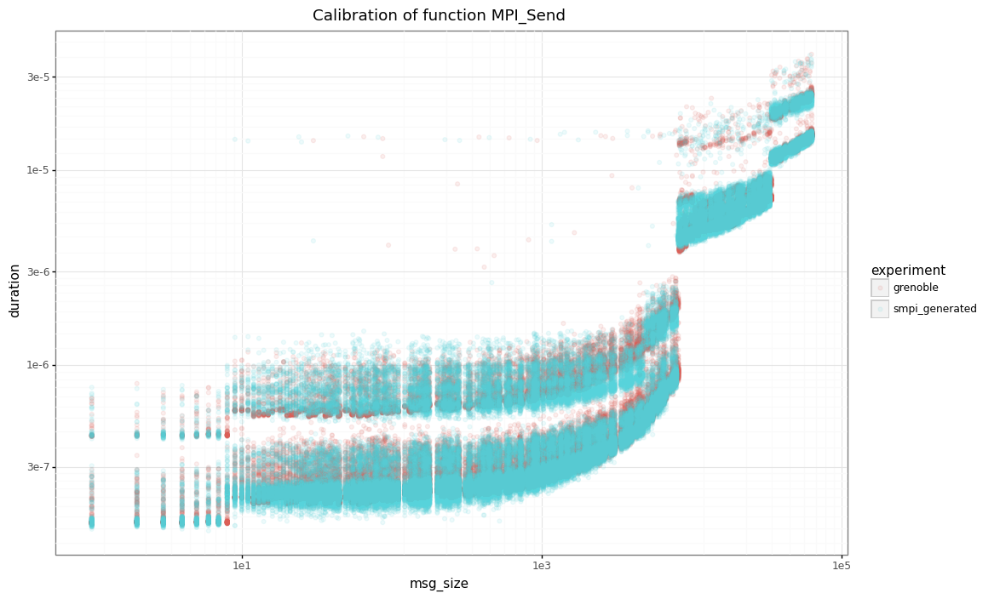

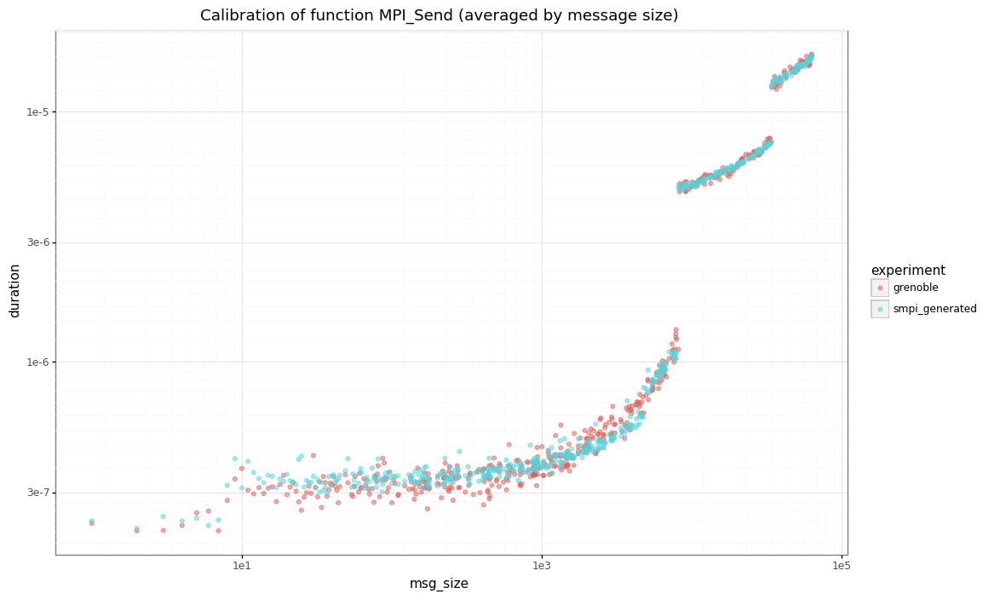

In [64]:
tmp = pandas.concat([df_send_async.sample(n=100000), send_generated])
plot_compare(tmp)

#### MPI_Isend

In [65]:
isend_models = read_df_from_json('isend_ckmeans.json')
isend_models

,mean,sd,prob,coefficient,min_x,max_x
0,2.286870e-07,5.226028e-08,0.766286,2.333333e-09,0.0,1.500000e+01
1,6.366702e-07,1.460424e-07,0.216429,2.333333e-09,0.0,1.500000e+01
2,2.021619e-05,1.377915e-06,0.010429,2.333333e-09,0.0,1.500000e+01
3,2.367753e-05,1.572203e-06,0.003571,2.333333e-09,0.0,1.500000e+01
4,4.210063e-05,2.103873e-06,0.002429,2.333333e-09,0.0,1.500000e+01
5,5.021994e-05,2.523559e-06,0.000857,2.333333e-09,0.0,1.500000e+01
6,2.530484e-07,5.128661e-08,0.769300,4.987685e-11,15.0,1.007900e+04
7,6.942097e-07,9.000397e-08,0.167416,4.987685e-11,15.0,1.007900e+04
8,1.150675e-06,2.268920e-07,0.049102,4.987685e-11,15.0,1.007900e+04
9,1.361383e-05,2.345747e-06,0.000331,4.987685e-11,15.0,1.007900e+04


In [66]:
seg_isend = SegmentedRegression()
for i, g in isend_models.groupby(['min_x', 'max_x'], as_index=False):
    seg_isend.append(Mixture(g["mean"].tolist(), g["sd"].tolist(), g["prob"].tolist(), g["coefficient"].head(1).iat[0]), i[0], i[1])

# generate points
isend_generated = pandas.DataFrame(dict(msg_size=df_isend.sample(n=100000).msg_size))
isend_generated['duration'] = isend_generated.apply(lambda row: seg_isend.sample(row['msg_size']), axis=1)
isend_generated['op'] = 'MPI_Isend'
isend_generated['experiment'] = 'smpi_generated'
isend_generated.head()

,msg_size,duration,op,experiment
355251,65597,2.781738e-07,MPI_Isend,smpi_generated
282913,22862,6.647594e-06,MPI_Isend,smpi_generated
17533,32315,3.035253e-06,MPI_Isend,smpi_generated
140550,897478,2.863996e-07,MPI_Isend,smpi_generated
308151,12306,1.489530e-06,MPI_Isend,smpi_generated


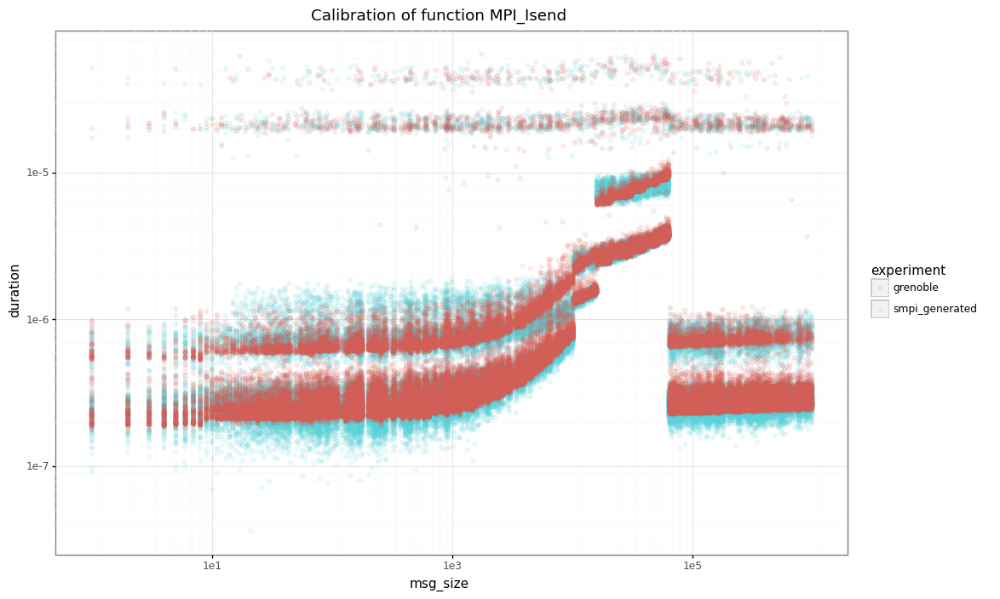

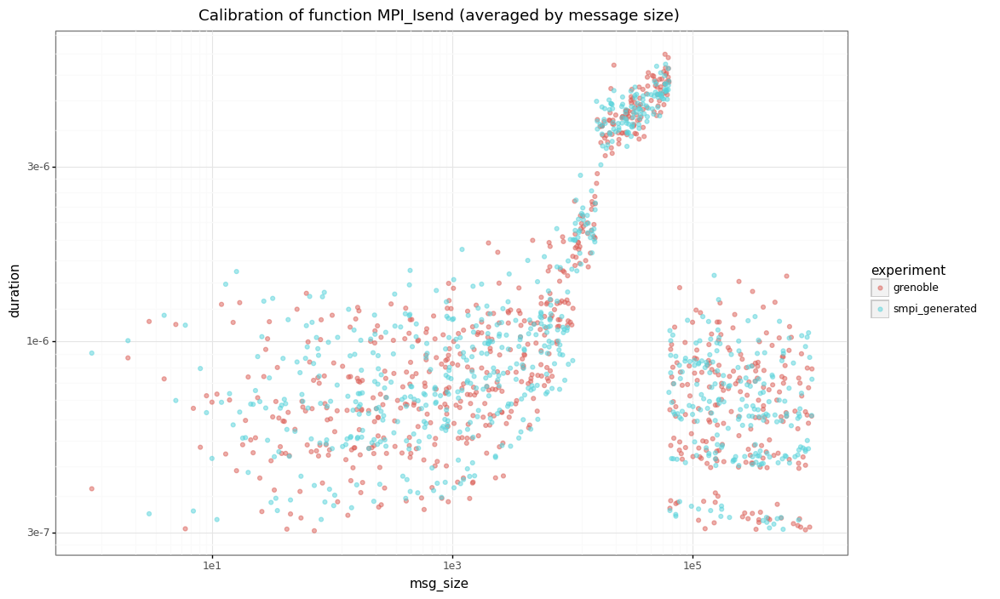

In [67]:
tmp = pandas.concat([isend_generated, df_isend.sample(n=100000)])
plot_compare(tmp)

#### MPI_Recv

In [68]:
recv_models = read_df_from_json('recv_ckmeans.json')
recv_models

,mean,sd,prob,coefficient,min_x,max_x
0,7.854667e-07,2.078796e-08,0.579143,3.333333e-10,0.0,8.0
1,8.963110e-07,5.325405e-08,0.102286,3.333333e-10,0.0,8.0
2,1.774207e-06,4.584075e-08,0.266571,3.333333e-10,0.0,8.0
3,2.021219e-06,9.379408e-08,0.040857,3.333333e-10,0.0,8.0
4,2.662565e-06,3.005444e-07,0.006571,3.333333e-10,0.0,8.0
5,5.615688e-06,3.982099e-07,0.004571,3.333333e-10,0.0,8.0
6,1.001451e-06,2.726898e-08,0.552346,5.168776e-11,8.0,8319.0
7,1.109214e-06,5.077507e-08,0.159257,5.168776e-11,8.0,8319.0
8,2.229532e-06,6.328803e-08,0.169983,5.168776e-11,8.0,8319.0
9,2.462767e-06,8.301583e-08,0.077899,5.168776e-11,8.0,8319.0


In [69]:
seg_recv = SegmentedRegression()
for i, g in recv_models.groupby(['min_x', 'max_x'], as_index=False):
    seg_recv.append(Mixture(g["mean"].tolist(), g["sd"].tolist(), g["prob"].tolist(), g["coefficient"].head(1).iat[0]), i[0], i[1])

# get only async part which is modeled by MPI_Recv overhead function
df_recv_async = df_recv.drop(df_recv[df_recv.msg_size >= threshold].index)

# generate points
recv_generated = pandas.DataFrame(dict(msg_size=df_recv_async.sample(n=100000).msg_size))
recv_generated['duration'] = recv_generated.apply(lambda row: seg_recv.sample(row['msg_size']), axis=1)
recv_generated['op'] = 'MPI_Recv'
recv_generated['experiment'] = 'smpi_generated'
recv_generated.head()

,msg_size,duration,op,experiment
132482,31842,0.000004,MPI_Recv,smpi_generated
210263,5840,0.000003,MPI_Recv,smpi_generated
281961,5383,0.000001,MPI_Recv,smpi_generated
226022,86,0.000001,MPI_Recv,smpi_generated
20825,445,0.000001,MPI_Recv,smpi_generated


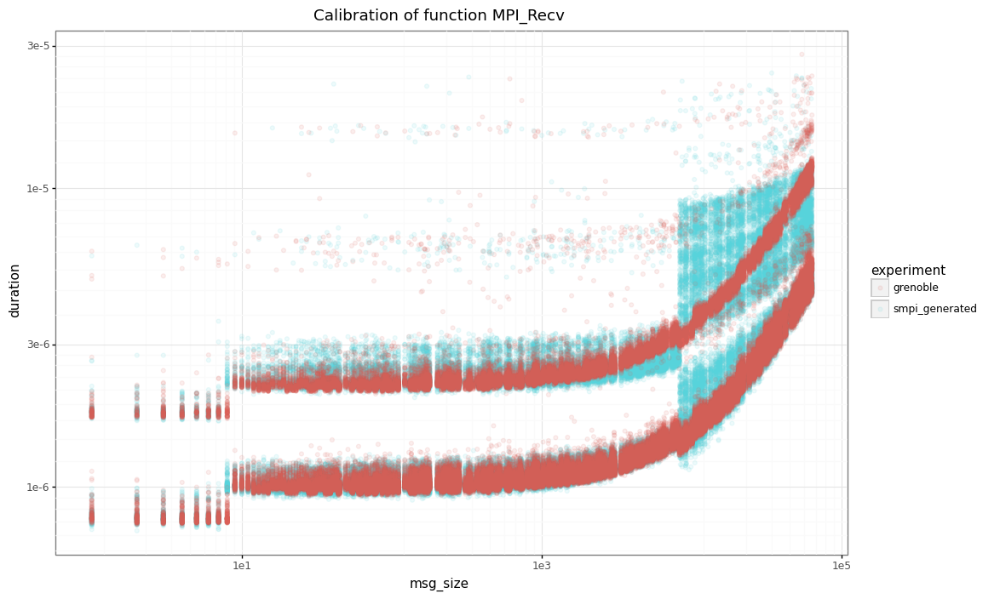

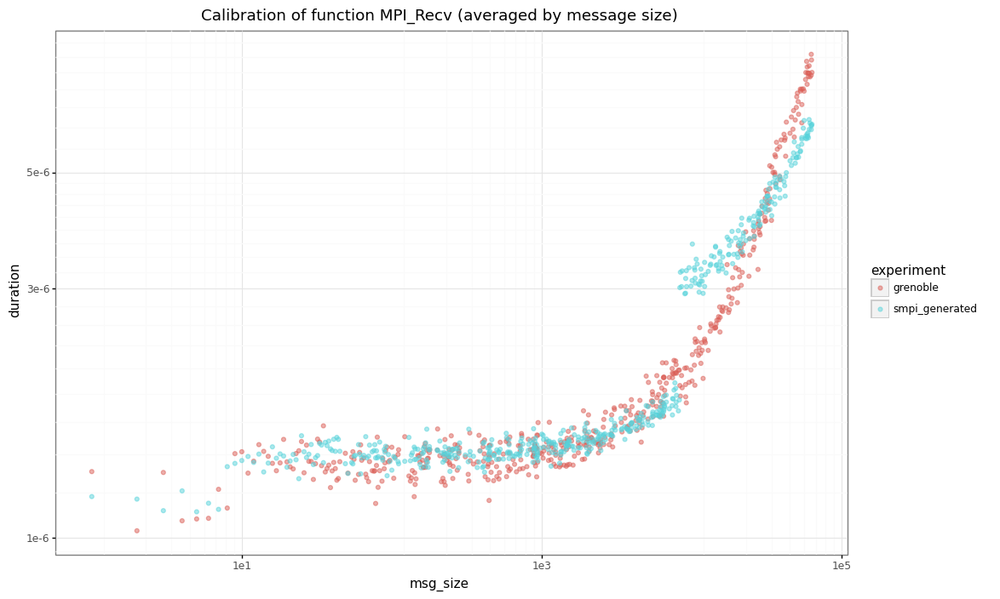

In [70]:
tmp = pandas.concat([recv_generated, df_recv_async.sample(n=100000)])
plot_compare(tmp)

#### MPI_Ping-Pong

In [71]:
pingpong_models = read_df_from_json("pingpong_ckmeans.json")
pingpong_models

,mean,sd,prob,coefficient,min_x,max_x
0,0.000012,4.356809e-07,0.499706,8.049632e-11,63305.0,3.402823e+38
1,0.000013,5.219426e-07,0.385196,8.049632e-11,63305.0,3.402823e+38
2,0.000019,1.673437e-06,0.073314,8.049632e-11,63305.0,3.402823e+38
3,0.000025,2.023256e-06,0.024108,8.049632e-11,63305.0,3.402823e+38
4,0.000030,2.530620e-06,0.011696,8.049632e-11,63305.0,3.402823e+38
5,0.000037,3.533823e-06,0.005980,8.049632e-11,63305.0,3.402823e+38


In [72]:
seg_pingpong = SegmentedRegression()
seg_pingpong.append(
    Mixture(
        pingpong_models["mean"].tolist(),
        pingpong_models["sd"].tolist(),
        pingpong_models["prob"].tolist(),
        pingpong_models["coefficient"].head(1).iat[0]),
    pingpong_models["min_x"].head(1).iat[0],
    pingpong_models["max_x"].head(1).iat[0]
)

# get only sync part which is modeled by MPI_ping-pong test
df_pingpong_sync = df_pingpong.drop(df_pingpong[df_pingpong.msg_size <= threshold].index)

# generate points
pingpong_generated = pandas.DataFrame(dict(msg_size=df_pingpong_sync.sample(n=100000).msg_size))
# special calculation: we can only consider the coefficient once.
# The coefficient is equivalent of the bandwidth which depends on the msg_size.
pingpong_generated['duration'] = pingpong_generated.apply(
    lambda row: seg_pingpong.sample(row['msg_size']), axis=1) + pingpong_generated.apply(
    lambda row: seg_pingpong.sample(row['msg_size']), axis=1)
pingpong_generated['op'] = 'PingPong'
pingpong_generated['experiment'] = 'smpi_generated'
pingpong_generated.head()

,msg_size,duration,op,experiment
47807,344186,0.000079,PingPong,smpi_generated
56891,86238,0.000037,PingPong,smpi_generated
342329,387565,0.000103,PingPong,smpi_generated
281035,387565,0.000088,PingPong,smpi_generated
288115,894593,0.000167,PingPong,smpi_generated


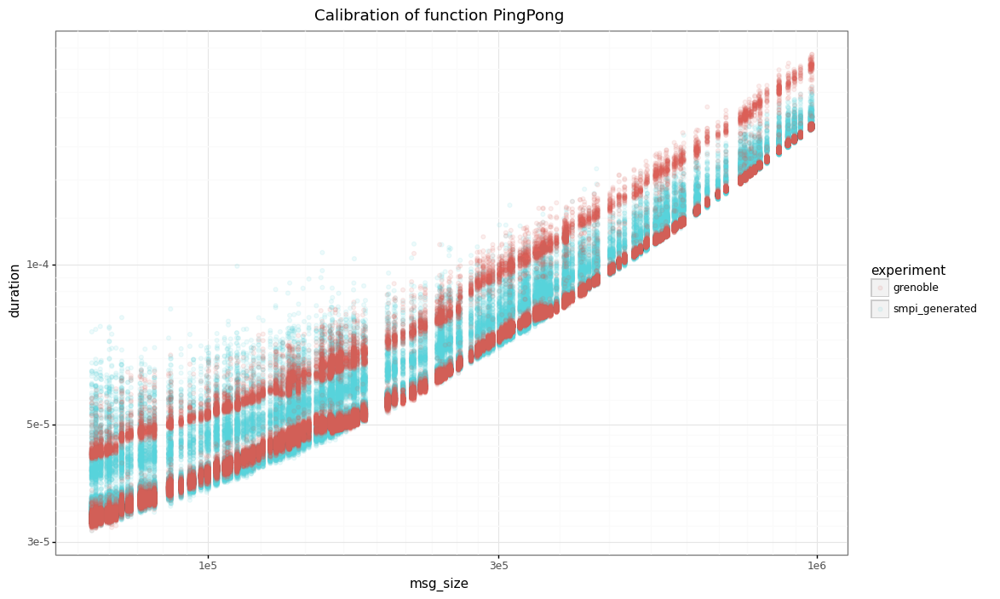

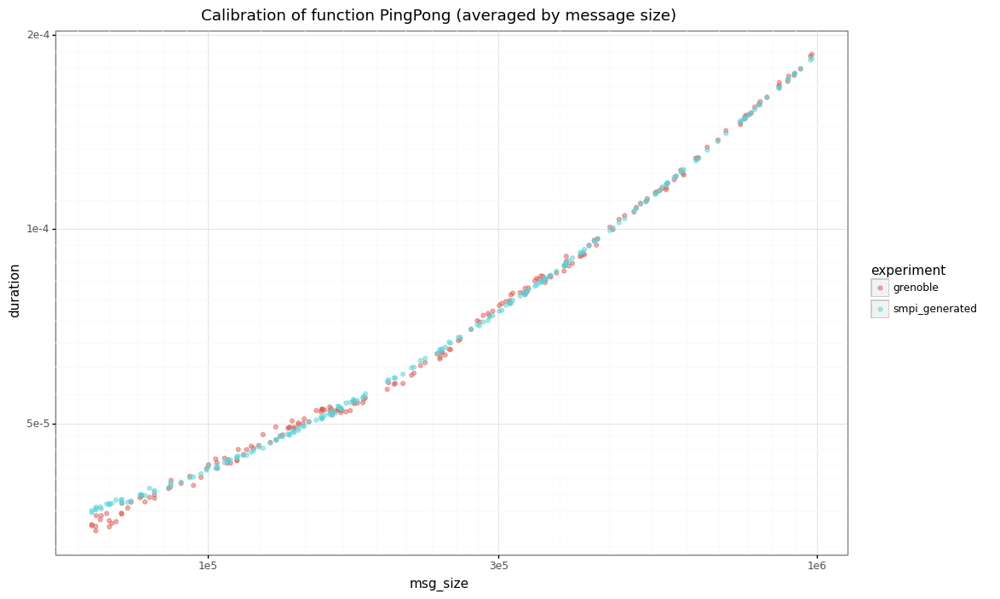

In [73]:
tmp = pandas.concat([pingpong_generated, df_pingpong_sync.sample(n=100000)])
plot_compare(tmp)

### Dhist

In [74]:
from scipy.stats import rv_histogram                                                                                                                  

class Dhist(VariabilityModel):
    """ Represents a histogram """
    def __init__(self, xbr: List[float], heights: List[float], coeff:float, log: bool):
        self.log = log
        self.xbr = xbr
        self.heights = heights
        self.coeff = coeff
        assert len(self.xbr) == len(self.heights) + 1
        self.rv = rv_histogram((self.heights, self.xbr))

    def sample(self, x):
        rv_sample = self.rv.rvs(size=1)
        if self.log:
            return self.coeff*x + numpy.exp(rv_sample[0])
        else:
            return self.coeff*x + rv_sample[0]

#### MPI_Send

In [75]:
send_dhist = None
with open('send_dhist.json', 'r') as f:
    send_dhist = json.load(fp=f)
send_dhist

{'bandwidth_base': 12330818795.43382,
 'latency_base': 1.2924904864614219e-05,
 'seg': [{'log': True,
   'min_x': 0,
   'max_x': 8.0,
   'xbr': [-16.0645658429023,
    -15.9268919677419,
    -15.8146632295928,
    -15.7246078482634,
    -15.5145642420779,
    -15.186496760337,
    -14.731624798547301,
    -14.449043295371899,
    -13.957256712520001,
    -13.3942266773347,
    -12.8311966421495,
    -12.268166606964199,
    -11.705136571779,
    -11.1427915697892],
   'height': [4510.1353222374,
    5863.66917728068,
    7666.84320115182,
    2453.22242306672,
    1045.4995520750301,
    347.102832455122,
    1448.7645909548,
    211.473845823314,
    0.0,
    0.0,
    0.0,
    0.0,
    1.77826778305436],
   'coeff': 6.785879450666414e-09},
  {'log': True,
   'min_x': 8.0,
   'max_x': 4778.0,
   'xbr': [-16.477867515041197,
    -16.0778382774327,
    -15.7506068444978,
    -15.551570498528699,
    -15.4623780487743,
    -15.409542779523198,
    -15.348182871594501,
    -15.197827516127

In [76]:
seg_send = SegmentedRegression()
for i in send_dhist['seg']:
    seg_send.append(
        Dhist(xbr=i["xbr"],heights=i["height"], coeff=i["coeff"], log=i["log"]),
        i["min_x"], i["max_x"]
    )
    
# get only async part which is modeled by MPI_Send overhead function
df_send_async = df_send.drop(df_send[df_send.msg_size >= threshold].index)

# generate points
send_generated = pandas.DataFrame(dict(msg_size=df_send_async.sample(n=100000).msg_size))
send_generated['duration'] = send_generated.apply(lambda row: seg_send.sample(row['msg_size']), axis=1)
send_generated['op'] = 'MPI_Send'
send_generated['experiment'] = 'smpi_generated'
send_generated.head()

,msg_size,duration,op,experiment
316615,413,2.126043e-07,MPI_Send,smpi_generated
49702,12159,1.163451e-05,MPI_Send,smpi_generated
32358,15315,5.567883e-06,MPI_Send,smpi_generated
318761,40,1.995204e-07,MPI_Send,smpi_generated
288631,1032,2.749201e-07,MPI_Send,smpi_generated


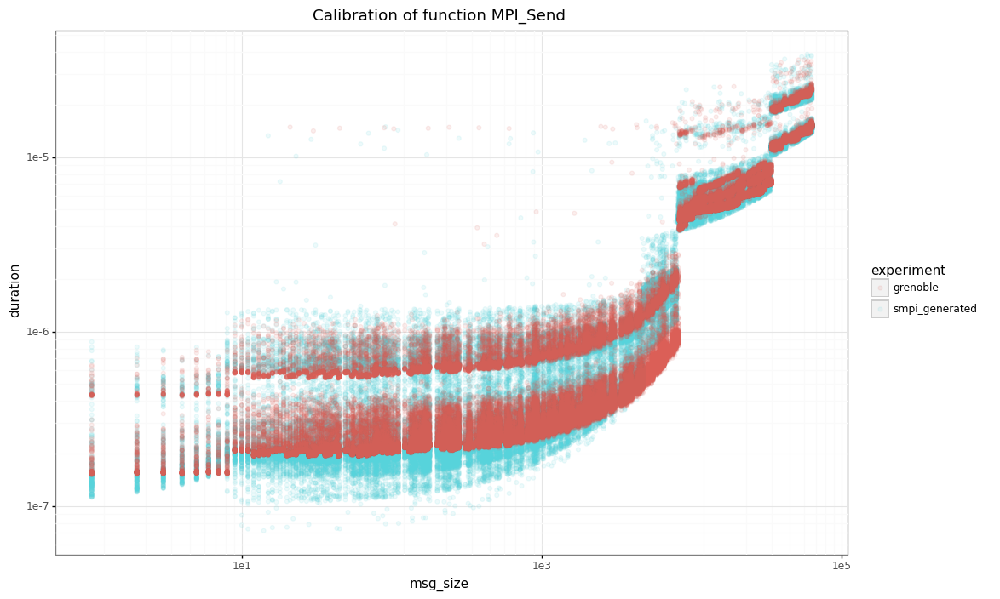

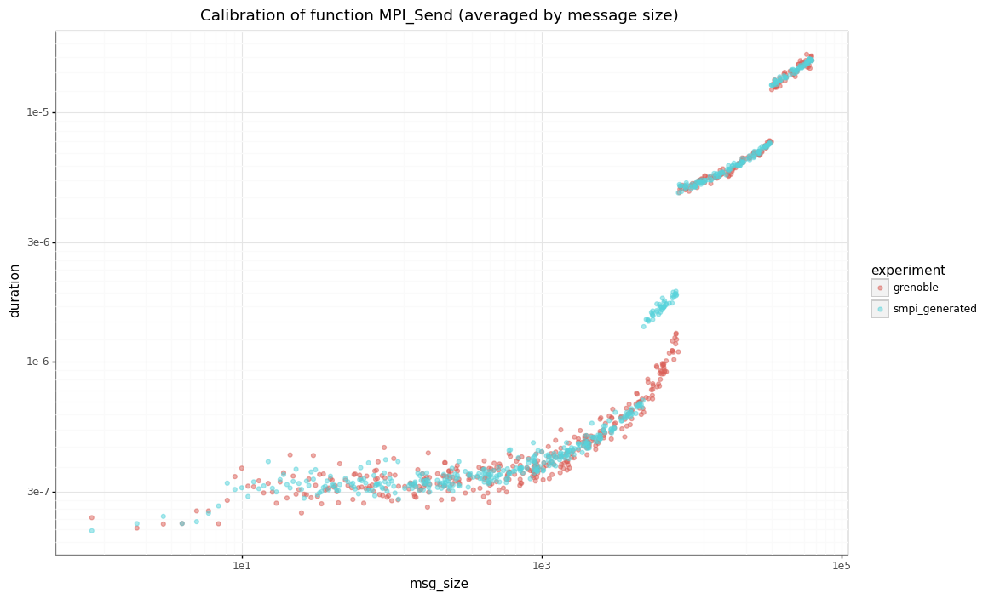

In [77]:
tmp = pandas.concat([send_generated, df_send_async.sample(n=100000)])
plot_compare(tmp)

#### MPI_Isend

In [78]:
isend_dhist = None
with open('isend_dhist.json', 'r') as f:
    isend_dhist = json.load(fp=f)
isend_dhist

{'bandwidth_base': 12330818795.43382,
 'latency_base': 1.2924904864614219e-05,
 'seg': [{'log': True,
   'min_x': 0,
   'max_x': 15.0,
   'xbr': [-16.0778563894789,
    -15.784235974729999,
    -15.6447360899793,
    -15.5246851604093,
    -15.3904739041949,
    -15.162572695246801,
    -14.7505171633725,
    -14.419113116168498,
    -14.0735064411074,
    -13.426049409531501,
    -12.6914424876639,
    -11.9562591128459,
    -11.2210757380279,
    -10.5418082994066,
    -9.82045979540014],
   'height': [2608.81042844107,
    7407.605546177049,
    8888.7203085503,
    7767.86226148884,
    3861.34938093187,
    1360.3628587742098,
    2113.59808244763,
    1955.4512167665803,
    235.04726847840197,
    1.36127222631902,
    0.0,
    0.0,
    142.800897680128,
    33.271019301628606],
   'coeff': 7.49242978634595e-09},
  {'log': True,
   'min_x': 15.0,
   'max_x': 10079.0,
   'xbr': [-19.1763004685913,
    -18.5068317779429,
    -17.8374692805649,
    -17.1692749091605,
    -16.519628

In [79]:
seg_isend = SegmentedRegression()
for i in isend_dhist['seg']:
    seg_isend.append(
        Dhist(xbr=i["xbr"],heights=i["height"], coeff=i["coeff"], log=i["log"]),
        i["min_x"], i["max_x"]
    )
    
# generate points
isend_generated = pandas.DataFrame(dict(msg_size=df_isend.sample(n=100000).msg_size))
isend_generated['duration'] = isend_generated.apply(lambda row: seg_isend.sample(row['msg_size']), axis=1)
isend_generated['op'] = 'MPI_Isend'
isend_generated['experiment'] = 'smpi_generated'
isend_generated.head()

,msg_size,duration,op,experiment
186496,58787,3.787289e-06,MPI_Isend,smpi_generated
249716,6296,5.844791e-07,MPI_Isend,smpi_generated
84291,5081,5.530844e-07,MPI_Isend,smpi_generated
208906,568279,2.791175e-07,MPI_Isend,smpi_generated
324898,7904,7.171409e-07,MPI_Isend,smpi_generated


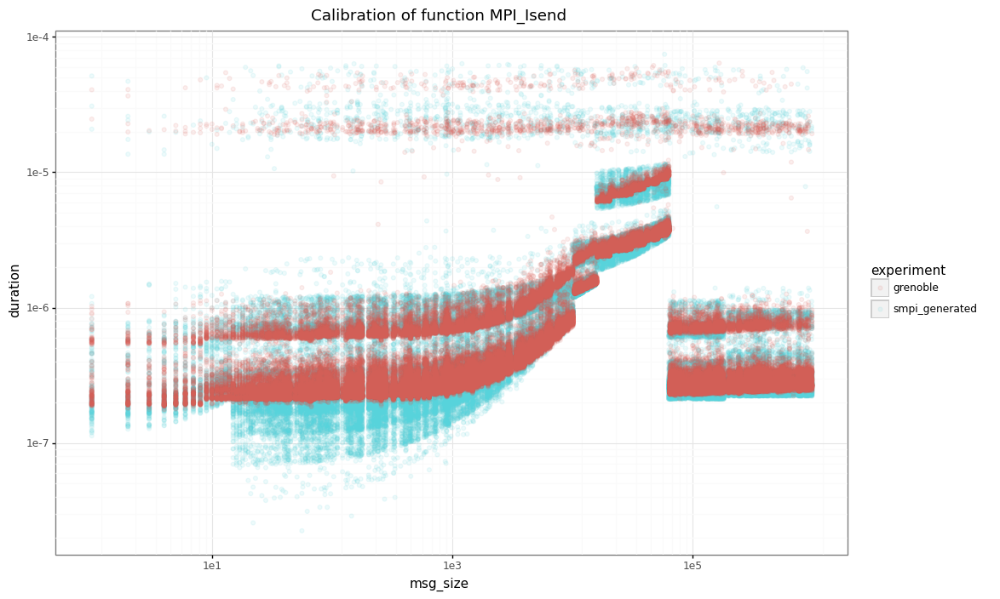

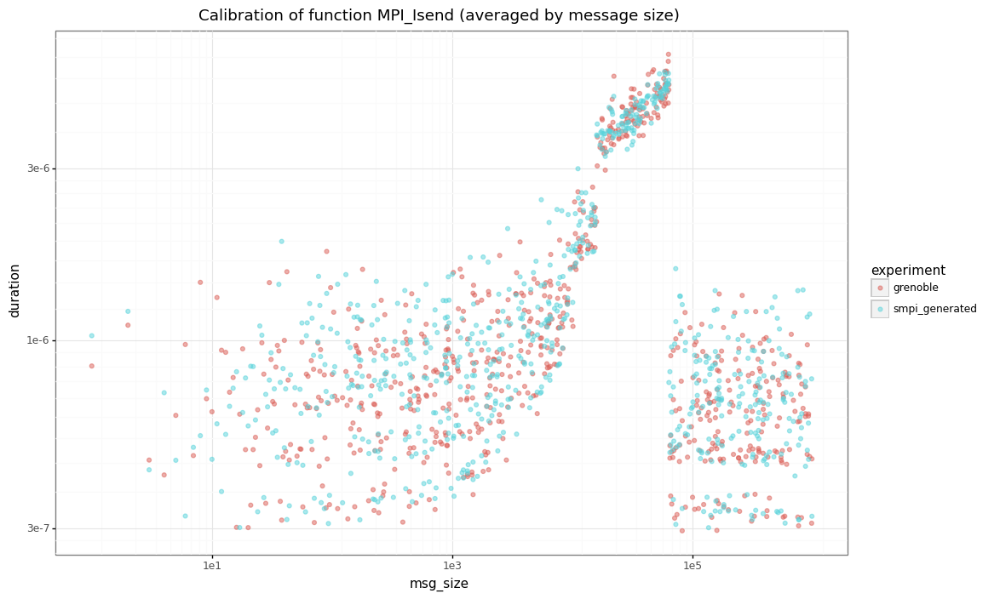

In [80]:
tmp = pandas.concat([isend_generated, df_isend.sample(n=100000)])
plot_compare(tmp)

#### MPI_Recv

In [81]:
recv_dhist = None
with open('recv_dhist.json', 'r') as f:
    recv_dhist = json.load(fp=f)
recv_dhist

{'bandwidth_base': 12330818795.43382,
 'latency_base': 1.2924904864614219e-05,
 'seg': [{'log': True,
   'min_x': 0,
   'max_x': 8.0,
   'xbr': [-14.111224802113302,
    -14.0810816479036,
    -14.034911122999599,
    -13.998232194779598,
    -13.906529956351399,
    -13.537975430577701,
    -13.2685458875824,
    -13.237774228915699,
    -13.180145758662,
    -12.8908549097585,
    -12.437646095780599,
    -11.984690644835599],
   'height': [12805.561001175,
    25919.7979789267,
    10367.821788225201,
    3621.8318530437896,
    243.81370006472,
    655.467103429189,
    12526.1366130476,
    6280.71153045921,
    550.386286919983,
    34.8146005669485,
    35.3235621000269],
   'coeff': 9.183549615799121e-41},
  {'log': True,
   'min_x': 8.0,
   'max_x': 8319.0,
   'xbr': [-14.316463553773,
    -14.008070832606098,
    -13.917922528714302,
    -13.8724990589011,
    -13.789456304093498,
    -13.7416266865713,
    -13.5545026692211,
    -13.1511886134568,
    -13.028009081902,
    -

In [82]:
seg_recv = SegmentedRegression()
for i in recv_dhist['seg']:
    seg_recv.append(
        Dhist(xbr=i["xbr"],heights=i["height"], coeff=i["coeff"], log=i["log"]),
        i["min_x"], i["max_x"]
    )
    
# get only async part which is modeled by MPI_Recv overhead function
df_recv_async = df_recv.drop(df_recv[df_recv.msg_size >= threshold].index)

# generate points
recv_generated = pandas.DataFrame(dict(msg_size=df_recv_async.sample(n=100000).msg_size))
recv_generated['duration'] = recv_generated.apply(lambda row: seg_recv.sample(row['msg_size']), axis=1)
recv_generated['op'] = 'MPI_Recv'
recv_generated['experiment'] = 'smpi_generated'
recv_generated.head()

,msg_size,duration,op,experiment
211990,28,9.538777e-07,MPI_Recv,smpi_generated
308272,76,2.360953e-06,MPI_Recv,smpi_generated
322999,14389,4.056665e-06,MPI_Recv,smpi_generated
32873,27821,6.067064e-06,MPI_Recv,smpi_generated
39735,1530,1.040881e-06,MPI_Recv,smpi_generated


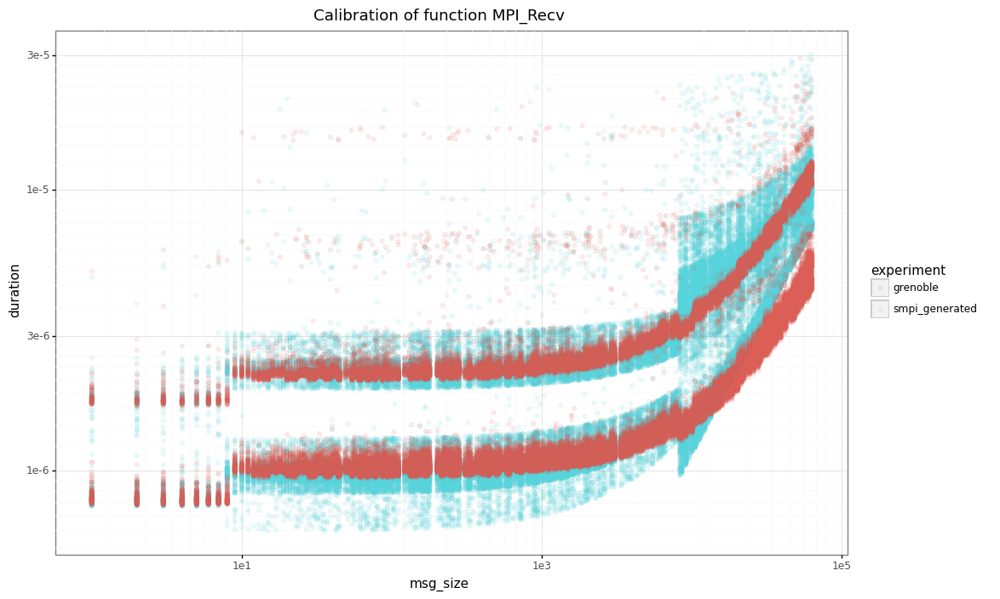

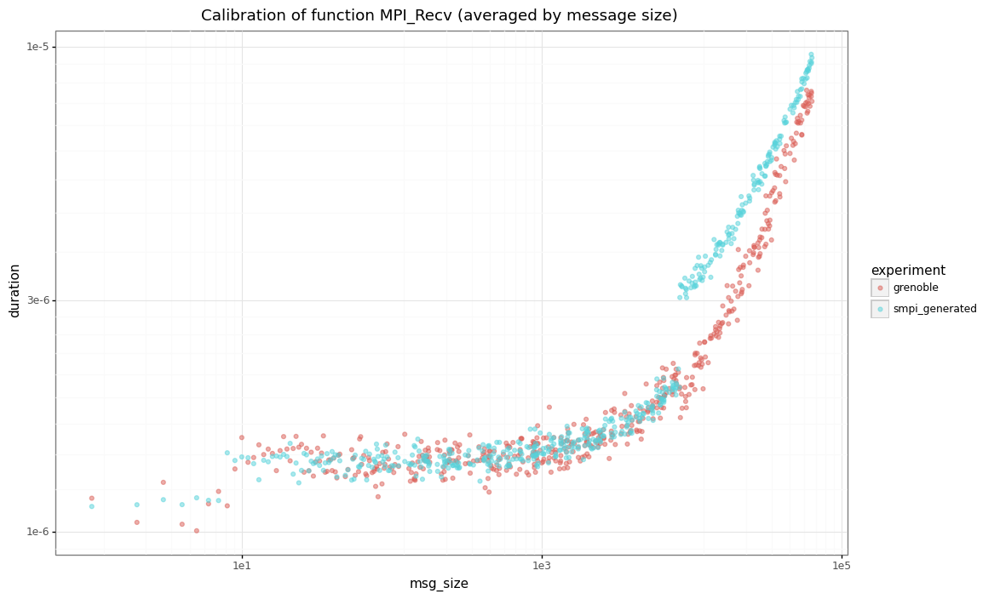

In [83]:
tmp = pandas.concat([recv_generated, df_recv_async.sample(n=100000)])
plot_compare(tmp)

#### MPI_Ping-Pong

In [84]:
pingpong_dhist = None
with open('pingpong_dhist.json', 'r') as f:
    pingpong_dhist = json.load(fp=f)
pingpong_dhist

{'bandwidth_base': 12330818795.43382,
 'latency_base': 1.2924904864614219e-05,
 'seg': [{'log': True,
   'min_x': 63305.0,
   'max_x': 3.4028234663852886e+38,
   'xbr': [-11.541562041539144,
    -11.441125408005446,
    -11.400596947874545,
    -11.372392420653046,
    -11.341231770713947,
    -11.306064060041345,
    -11.262313043898645,
    -11.167260850740746,
    -11.054191810141747,
    -10.945733341460246,
    -10.851269918507747,
    -10.748196672490847,
    -10.639355545006445,
    -10.532059052445776,
    -10.421953284283596,
    -10.311044865949563,
    -10.199305798019065,
    -10.086544751090685,
    -9.973069718835006],
   'height': [28047.5350565562,
    386265.096035713,
    648676.945998964,
    566809.701663792,
    477810.03815685294,
    342030.173378546,
    41775.283991878,
    972.856932519077,
    10123.6907854913,
    43371.2845877054,
    21848.5405963759,
    9334.7066819517,
    12553.998437911001,
    6766.22135638404,
    5166.42477286285,
    3535.02143266

In [85]:
seg_pingpong = SegmentedRegression()
for i in pingpong_dhist['seg']:
    seg_pingpong.append(
        Dhist(xbr=i["xbr"],heights=i["height"], coeff=i["coeff"], log=i["log"]),
        i["min_x"], i["max_x"]
    )
    
# get only sync part which is modeled by MPI_ping-pong test
df_pingpong_sync = df_pingpong.drop(df_pingpong[df_pingpong.msg_size <= threshold].index)

# generate points
pingpong_generated = pandas.DataFrame(dict(msg_size=df_pingpong_sync.sample(n=100000).msg_size))
# special calculation: we can only consider the coefficient once.
# The coefficient is equivalent of the bandwidth which depends on the msg_size.
pingpong_generated['duration'] = pingpong_generated.apply(
    lambda row: seg_pingpong.sample(row['msg_size']), axis=1) + pingpong_generated.apply(
    lambda row: seg_pingpong.sample(row['msg_size']), axis=1)
pingpong_generated['op'] = 'PingPong'
pingpong_generated['experiment'] = 'smpi_generated'
pingpong_generated.head()

,msg_size,duration,op,experiment
157417,526144,0.000108,PingPong,smpi_generated
79711,408229,0.000090,PingPong,smpi_generated
353370,779429,0.000152,PingPong,smpi_generated
304174,150683,0.000048,PingPong,smpi_generated
211156,138505,0.000044,PingPong,smpi_generated


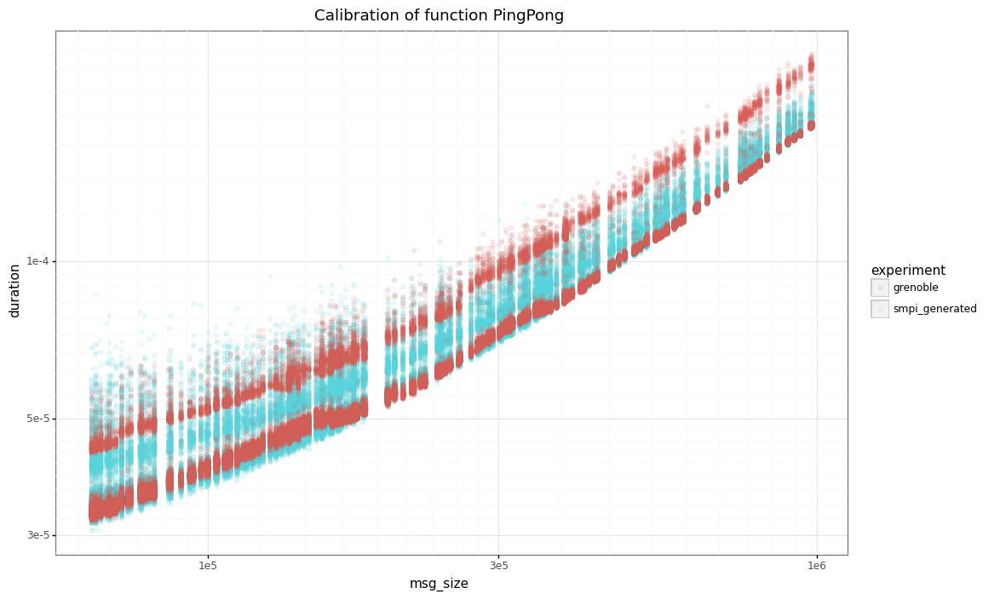

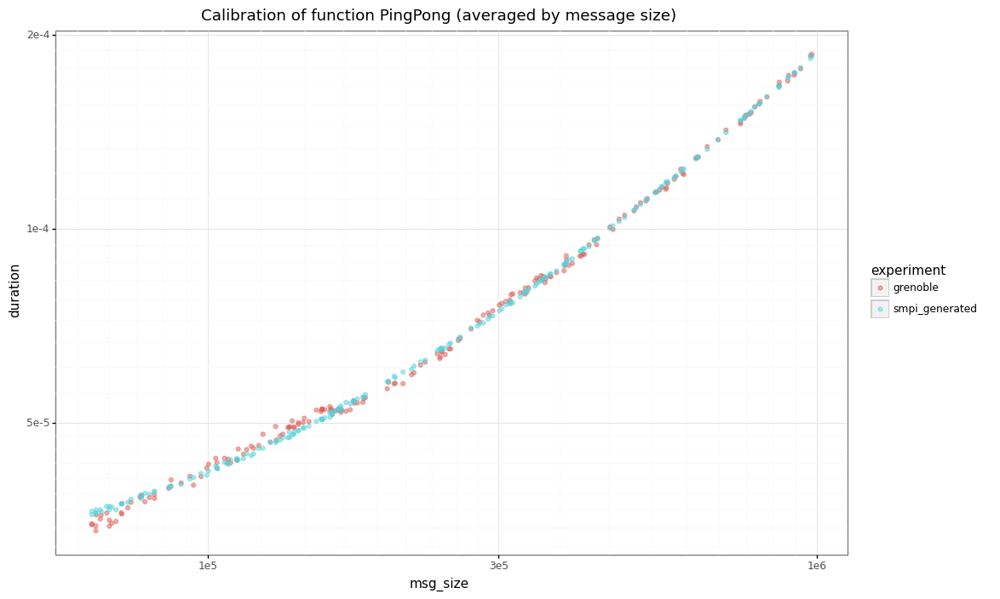

In [86]:
tmp = pandas.concat([pingpong_generated, df_pingpong_sync.sample(n=100000)])
plot_compare(tmp)

## SimGrid execution

Create hostfile for calibration file.

In [87]:
%%bash

cd /source/simgrid.git/docs/source/tuto_network_calibration/

cat << EOF > /tmp/host.txt
dahu-0.grid5000.fr
dahu-1.grid5000.fr
EOF

### Ckmeans.1d.dp

In [88]:
%%bash

cd /source/simgrid.git/docs/source/tuto_network_calibration/

smpirun --cfg=smpi/simulate-computation:0 \
    --cfg=smpi/display-timing:yes \
    -platform ./libdahu_ckmeans.so \
    -hostfile /tmp/host.txt -np 2 \
    /source/platform-calibration/src/calibration/calibrate -d /tmp/exp -m 1 -M 1000000 -p exp -s /tmp/exp.csv

Read bandwidth_base: 1.233082e+10 latency_base: 1.292490e-05
Starting parsing file: pingpong_ckmeans.json
Starting parsing file: send_ckmeans.json
Starting parsing file: isend_ckmeans.json
Starting parsing file: recv_ckmeans.json
[0] MPI initialized
[0] nb_exp=115200, largest_size=980284
[0] Alloc size: 1960568 
[1] MPI initialized
[1] nb_exp=115200, largest_size=980284
[1] Alloc size: 1960568 


[0.000000] [xbt_cfg/INFO] Configuration change: Set 'smpi/privatization' to '1'
[0.000000] [xbt_cfg/INFO] Configuration change: Set 'smpi/np' to '2'
[0.000000] [xbt_cfg/INFO] Configuration change: Set 'smpi/hostfile' to '/tmp/host.txt'
[0.000000] [xbt_cfg/INFO] Configuration change: Set 'surf/precision' to '1e-9'
[0.000000] [xbt_cfg/INFO] Configuration change: Set 'network/model' to 'SMPI'
[0.000000] [xbt_cfg/INFO] Configuration change: Set 'smpi/simulate-computation' to '0'
[0.000000] [xbt_cfg/INFO] Configuration change: Set 'smpi/display-timing' to 'yes'
[0.000000] [xbt_cfg/INFO] Configuration change: Set 'smpi/tmpdir' to '/tmp'
[0.000000] [smpi_config/INFO] You did not set the power of the host running the simulation.  The timings will certainly not be accurate.  Use the option "--cfg=smpi/host-speed:<flops>" to set its value.  Check https://simgrid.org/doc/latest/Configuring_SimGrid.html#automatic-benchmarking-of-smpi-code for more information.
[6.845963] [smpi_utils/INFO] Simulate

Get results.

In [89]:
%%bash
cd /tmp && zip smpi_test_ckmeans.zip exp/*
cp smpi_test_ckmeans.zip /source/simgrid.git/docs/source/tuto_network_calibration

updating: exp/exp_Iprobe.csv (deflated 83%)
updating: exp/exp_Isend.csv (deflated 76%)
updating: exp/exp_PingPong.csv (deflated 78%)
updating: exp/exp_Recv.csv (deflated 73%)
updating: exp/exp_Test.csv (deflated 75%)
updating: exp/exp_Wtime.csv (deflated 83%)


### Dhist

In [90]:
%%bash

cd /source/simgrid.git/docs/source/tuto_network_calibration/

smpirun --cfg=smpi/simulate-computation:0 \
    --cfg=smpi/display-timing:yes \
    -platform ./libdahu_dhist.so \
    -hostfile /tmp/host.txt -np 2 \
    /source/platform-calibration/src/calibration/calibrate -d /tmp/exp -m 1 -M 1000000 -p exp -s /tmp/exp.csv

Read bandwidth_base: 1.233082e+10 latency_base: 1.292490e-05
Starting parsing file: pingpong_dhist.json
Starting parsing file: send_dhist.json
Starting parsing file: isend_dhist.json
Starting parsing file: recv_dhist.json
[0] MPI initialized
[0] nb_exp=115200, largest_size=980284
[0] Alloc size: 1960568 
[1] MPI initialized
[1] nb_exp=115200, largest_size=980284
[1] Alloc size: 1960568 


[0.000000] [xbt_cfg/INFO] Configuration change: Set 'smpi/privatization' to '1'
[0.000000] [xbt_cfg/INFO] Configuration change: Set 'smpi/np' to '2'
[0.000000] [xbt_cfg/INFO] Configuration change: Set 'smpi/hostfile' to '/tmp/host.txt'
[0.000000] [xbt_cfg/INFO] Configuration change: Set 'surf/precision' to '1e-9'
[0.000000] [xbt_cfg/INFO] Configuration change: Set 'network/model' to 'SMPI'
[0.000000] [xbt_cfg/INFO] Configuration change: Set 'smpi/simulate-computation' to '0'
[0.000000] [xbt_cfg/INFO] Configuration change: Set 'smpi/display-timing' to 'yes'
[0.000000] [xbt_cfg/INFO] Configuration change: Set 'smpi/tmpdir' to '/tmp'
[0.000000] [smpi_config/INFO] You did not set the power of the host running the simulation.  The timings will certainly not be accurate.  Use the option "--cfg=smpi/host-speed:<flops>" to set its value.  Check https://simgrid.org/doc/latest/Configuring_SimGrid.html#automatic-benchmarking-of-smpi-code for more information.
[6.761108] [smpi_utils/INFO] Simulate

Get results.

In [91]:
%%bash
cd /tmp && zip smpi_test_dhist.zip exp/*
cp smpi_test_dhist.zip /source/simgrid.git/docs/source/tuto_network_calibration

updating: exp/exp_Iprobe.csv (deflated 83%)
updating: exp/exp_Isend.csv (deflated 76%)
updating: exp/exp_PingPong.csv (deflated 78%)
updating: exp/exp_Recv.csv (deflated 73%)
updating: exp/exp_Test.csv (deflated 75%)
updating: exp/exp_Wtime.csv (deflated 83%)


## SimGrid vs Reality

Finally, let's compare the SimGrid results the real ones.

### Ckmeans.1d.dp

In [92]:
result_smpi = extract_zip('smpi_test_ckmeans.zip')

# Special processing for the Pingpong dataset
df_smpi_pingpong = result_smpi['exp/exp_PingPong.csv']
pingpong_smpi_send = df_smpi_pingpong[df_smpi_pingpong.op=='MPI_Send'].reset_index(drop=True)
pingpong_smpi_recv = df_smpi_pingpong[df_smpi_pingpong.op=='MPI_Recv'].reset_index(drop=True)
df_smpi_pingpong = pandas.DataFrame(dict(op = 'PingPong',
                   msg_size = pingpong_smpi_send.msg_size,
                   start    = pingpong_smpi_send.start,
                   duration = pingpong_smpi_recv.duration + pingpong_smpi_send.duration,
                   experiment = pingpong_smpi_send.experiment
              ))

df_smpi_send = pingpong_smpi_send
df_smpi_isend = result_smpi['exp/exp_Isend.csv']
df_smpi_recv = result_smpi['exp/exp_Recv.csv']

#### MPI_Send

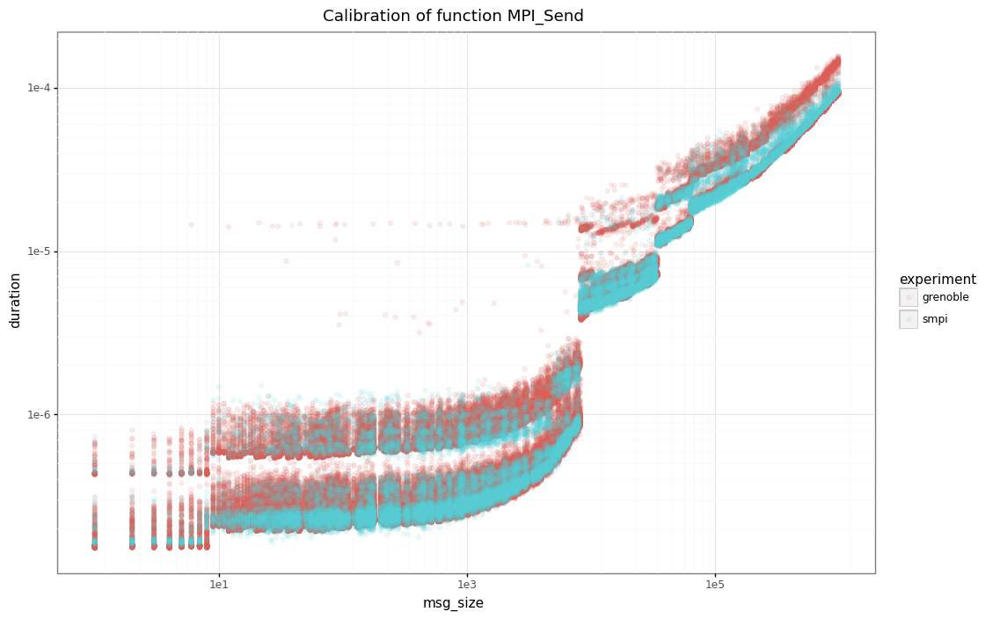

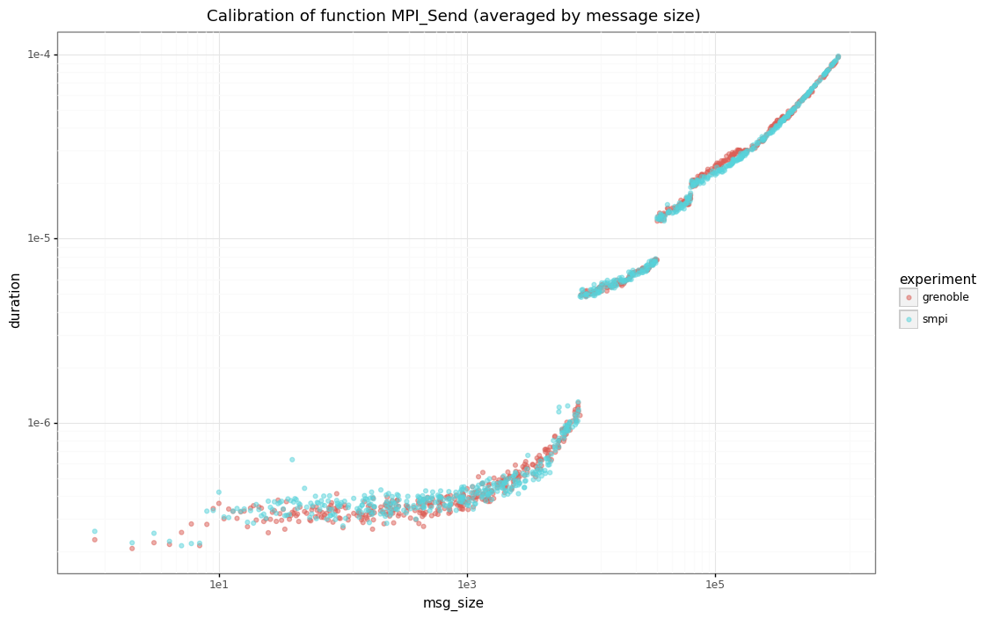

In [93]:
tmp = pandas.concat([df_send, df_smpi_send])
plot_compare(tmp)

#### MPI_ISend

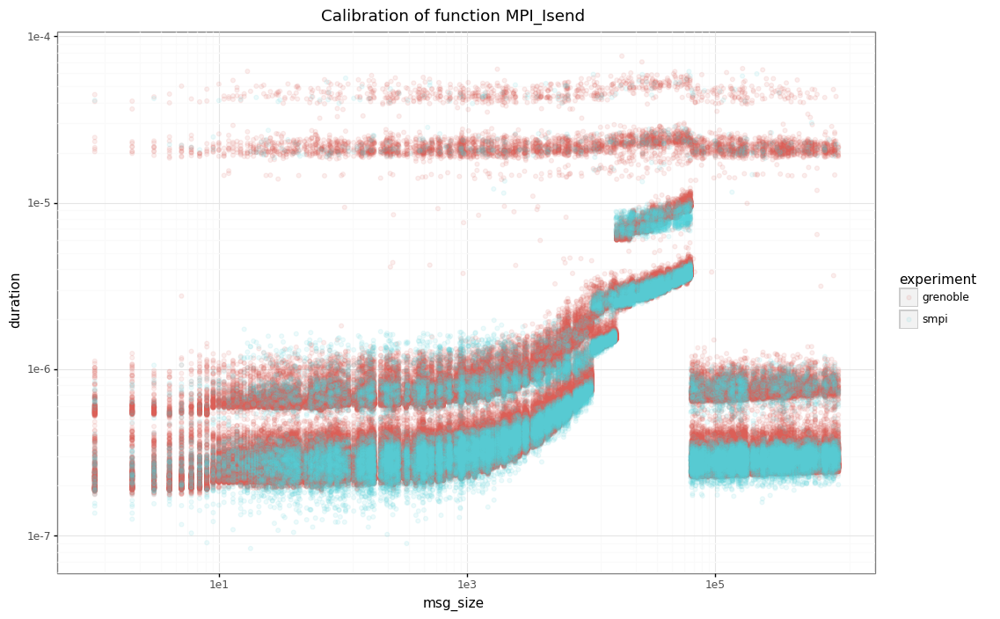

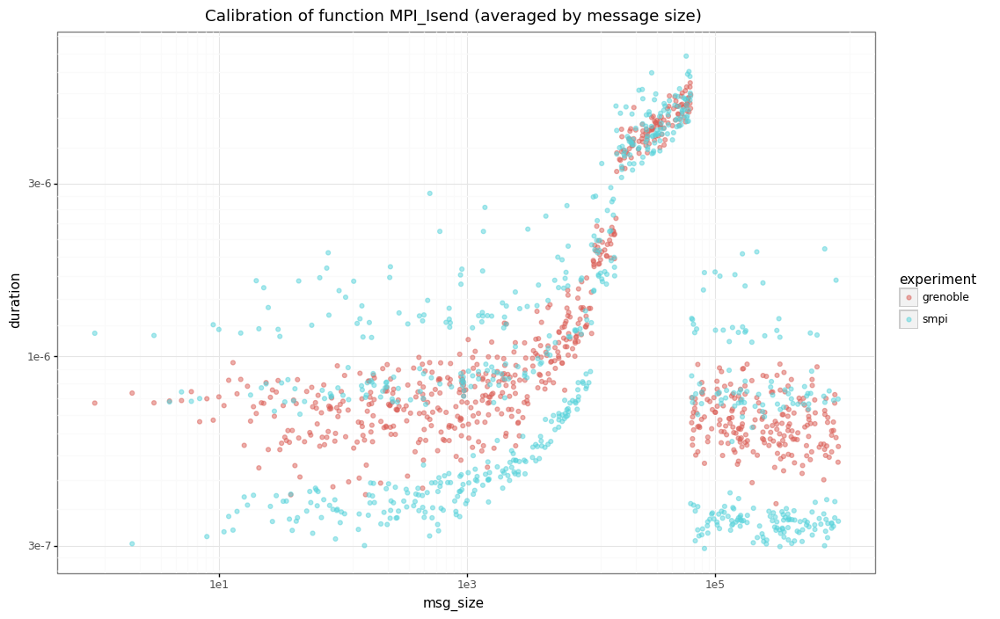

In [94]:
tmp = pandas.concat([df_isend, df_smpi_isend])
plot_compare(tmp)

#### MPI_Recv

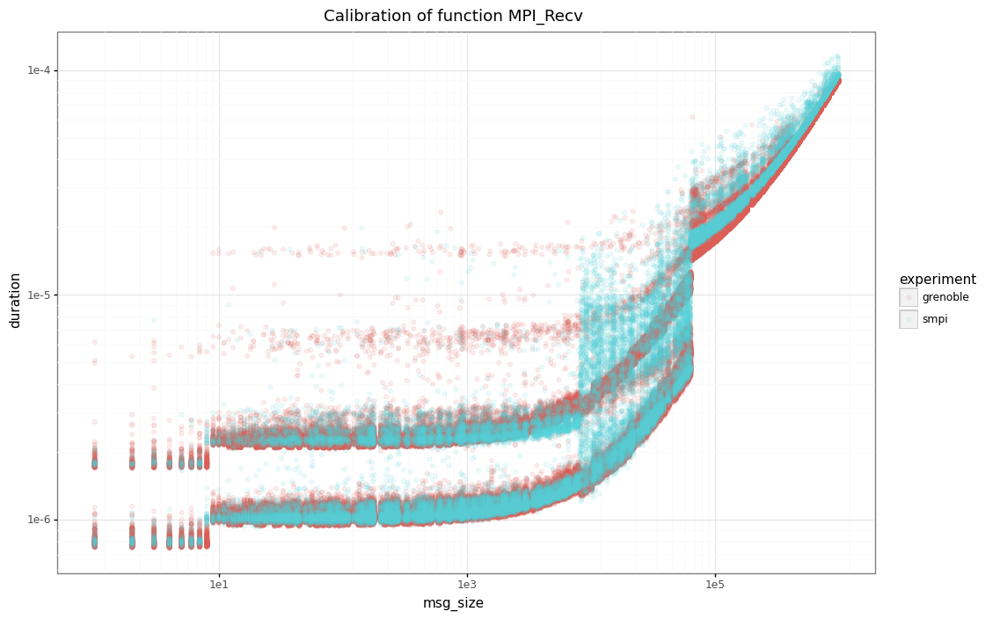

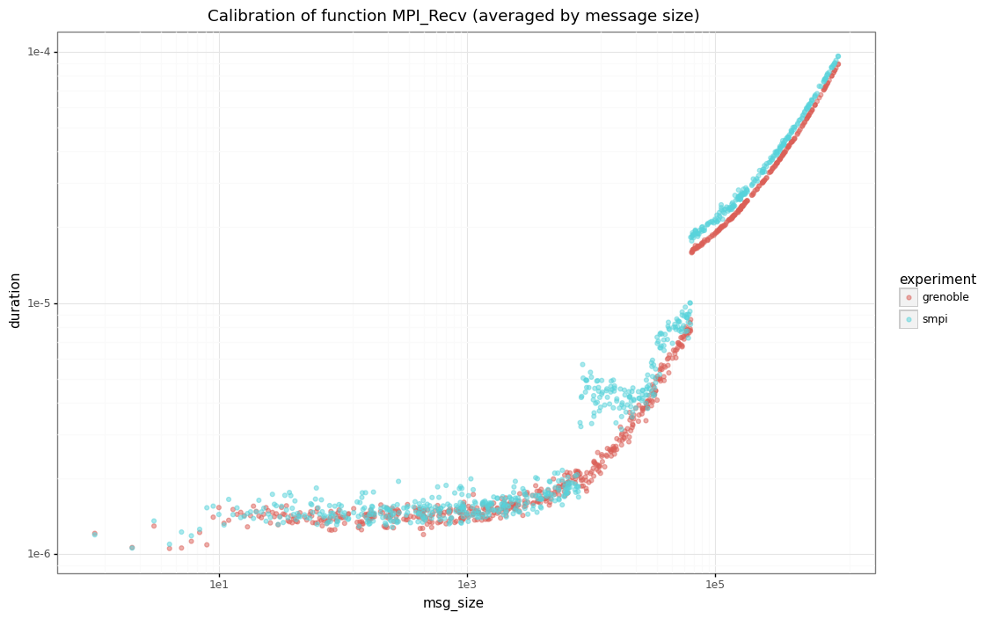

In [95]:
tmp = pandas.concat([df_recv, df_smpi_recv])
plot_compare(tmp)

#### MPI_Ping-Pong

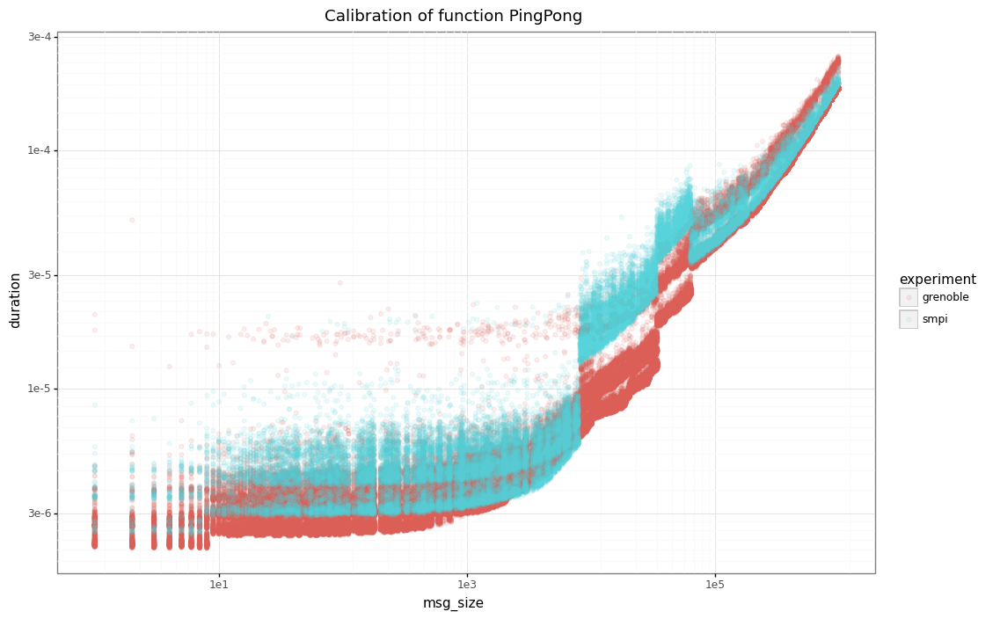

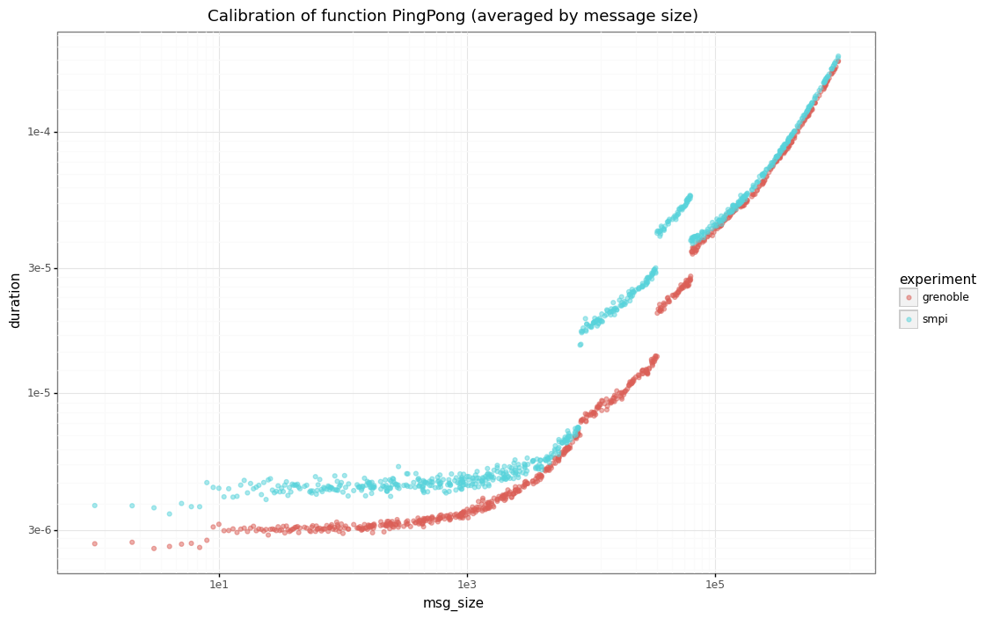

In [96]:
tmp = pandas.concat([df_pingpong, df_smpi_pingpong])
plot_compare(tmp)

Note that for ping-ping tests, we have an important gap between the real performance (in red) and SimGrid (in blue) for messages below our sync/async threshold (63305).

This behavior is explained by how we measure the extra cost for each MPI_Send/MPI_Recv operations.

In calibrate.c in platform-calibration, the ping-pong test is as follows (considering the processes are synchronized):

![](./fig/pingpong_real.png)

We can see that we measure the delay at **Process 1**, just before the first *MPI_Send-1* until the end of respective *MPI_Recv-2*. Moreover, the extra cost of MPI operations is paid concurrently with the network communication cost.

In this case, it doesn't matter when the *MPI_Send-2* will finish. Despite we expect that it finished before the *MPI_Recv-2*, we couldn't be sure.

Also, both processes are running in parallel, so we can expect that the measure time will be: $max(\text{MPI_Send-1}, \text{MPI_Recv-1}) + \text{MPI_Recv-2}$
- $max(\text{MPI_Send-1}, \text{MPI_Recv-1})$: since we cannot start *MPI_Recv-2* or *MPI_Send_2* before finishing both commands
- $\text{MPI_Recv-2}$: because we measure just after the finishing of this receive

However, the simulation world is a little more stable. The same communication occurs in the following way:

![](./fig/pingpong_simgrid.png)

In SimGrid, the extra costs are paid sequentially. That means, initially we pay the extra cost for *MPI_Send-1*, after the network communication cost, followed by the extra cost for *MPI-Recv-1*.

This effect leads to a total time of: *MPI_Send-1* + *MPI_Recv-1* + *MPI_Send-2* + *MPI_Recv-2* which is slighty higher than the real cost.

The same doesn't happen for largest messages because we don't pay the extra overhead cost for each MPI operation (the communication is limited by the network capacity).

#### Overall

/usr/local/lib/python3.9/dist-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 12 x 8 in image.
/usr/local/lib/python3.9/dist-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: plot_op_simgrid_ckmeans.png


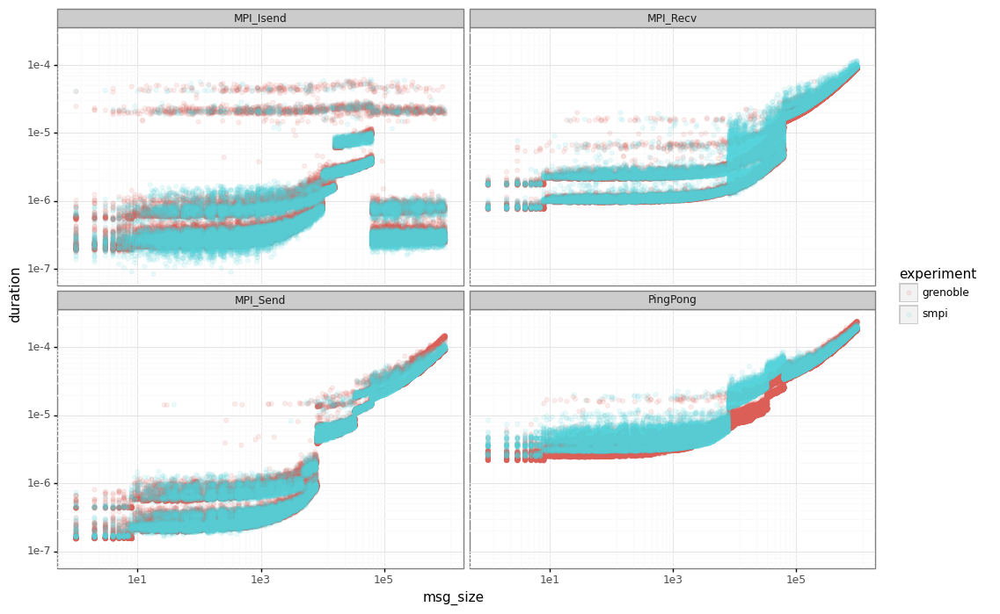

In [97]:
N = 100000
tmp = pandas.concat([df_send.sample(N), df_smpi_send, df_isend.sample(N), df_smpi_isend, df_recv.sample(N), df_smpi_recv, df_pingpong.sample(N), df_smpi_pingpong])

plot = ggplot(tmp, aes(x='msg_size', y='duration', color='experiment')) + geom_point(alpha=0.1) + scale_x_log10() + scale_y_log10() + facet_wrap('~op') + theme_bw()
plot.save('plot_op_simgrid_ckmeans.png')
print(plot)

### Dhist

In [98]:
result_smpi = extract_zip('smpi_test_dhist.zip')

# Special processing for the Pingpong dataset
df_smpi_pingpong = result_smpi['exp/exp_PingPong.csv']
pingpong_smpi_send = df_smpi_pingpong[df_smpi_pingpong.op=='MPI_Send'].reset_index(drop=True)
pingpong_smpi_recv = df_smpi_pingpong[df_smpi_pingpong.op=='MPI_Recv'].reset_index(drop=True)
df_smpi_pingpong = pandas.DataFrame(dict(op = 'PingPong',
                   msg_size = pingpong_smpi_send.msg_size,
                   start    = pingpong_smpi_send.start,
                   duration = pingpong_smpi_recv.duration + pingpong_smpi_send.duration,
                   experiment = pingpong_smpi_send.experiment
              ))

df_smpi_send = pingpong_smpi_send
df_smpi_isend = result_smpi['exp/exp_Isend.csv']
df_smpi_recv = result_smpi['exp/exp_Recv.csv']

#### MPI_Send

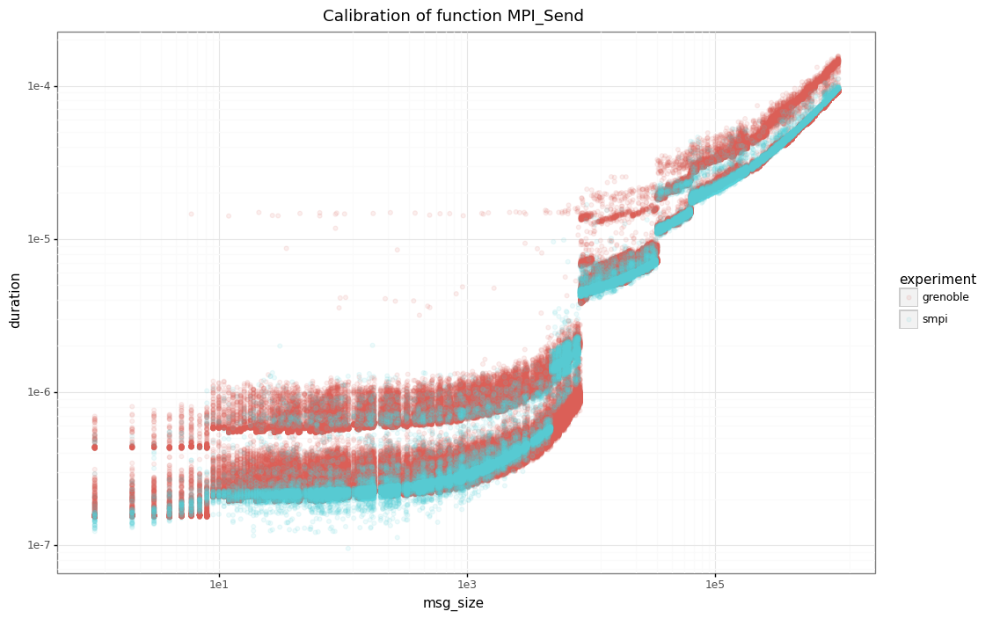

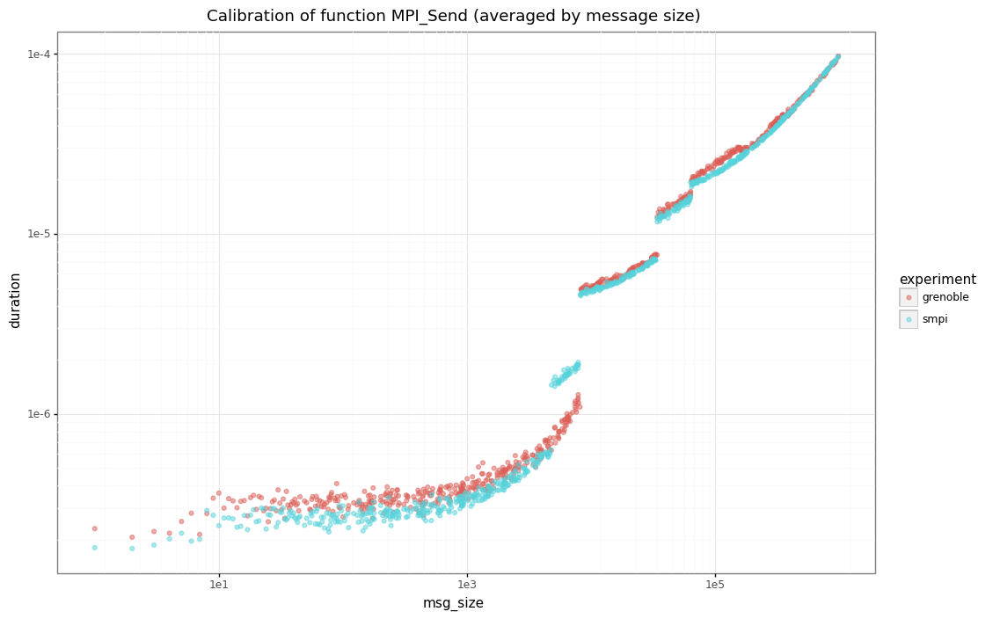

In [99]:
tmp = pandas.concat([df_send, df_smpi_send])
plot_compare(tmp)

#### MPI_ISend

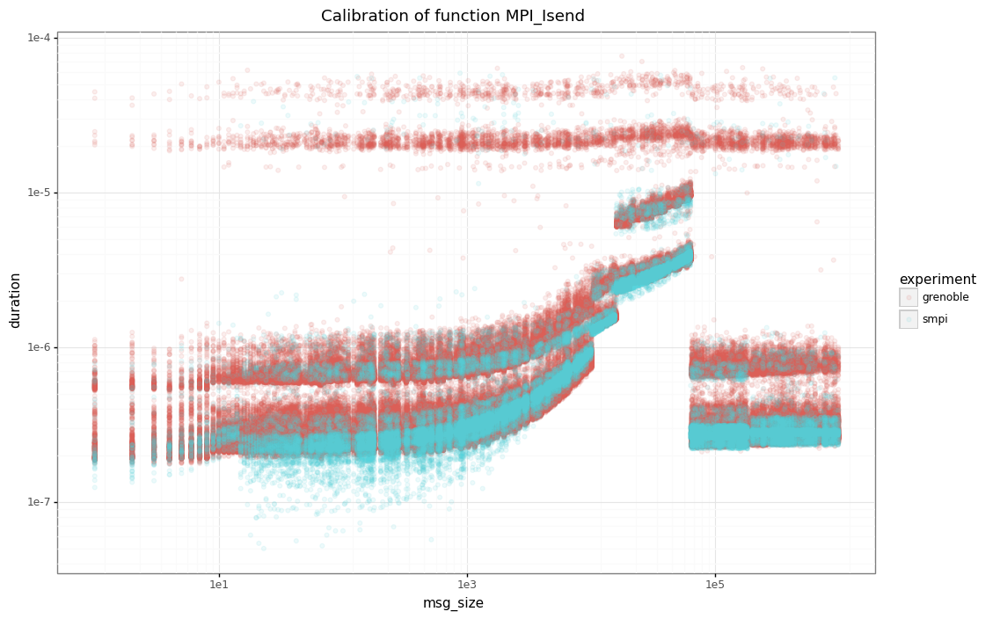

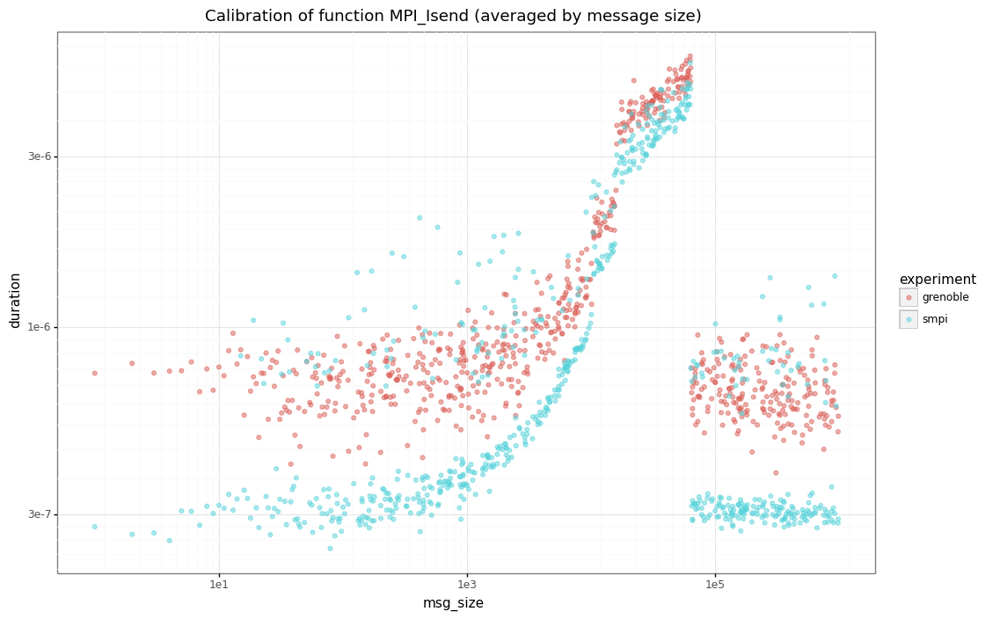

In [100]:
tmp = pandas.concat([df_isend, df_smpi_isend])
plot_compare(tmp)

#### MPI_Recv

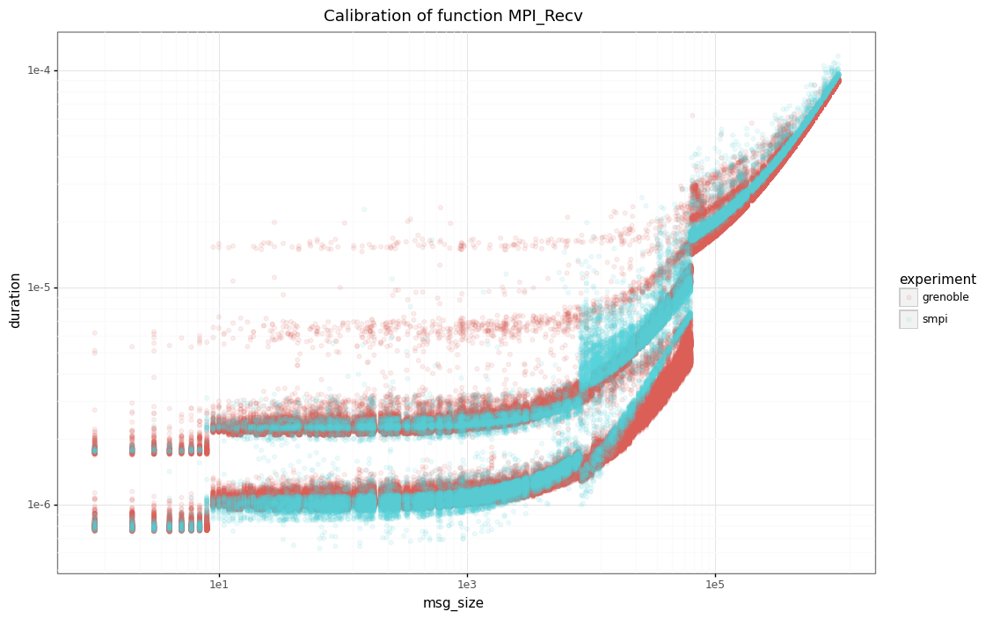

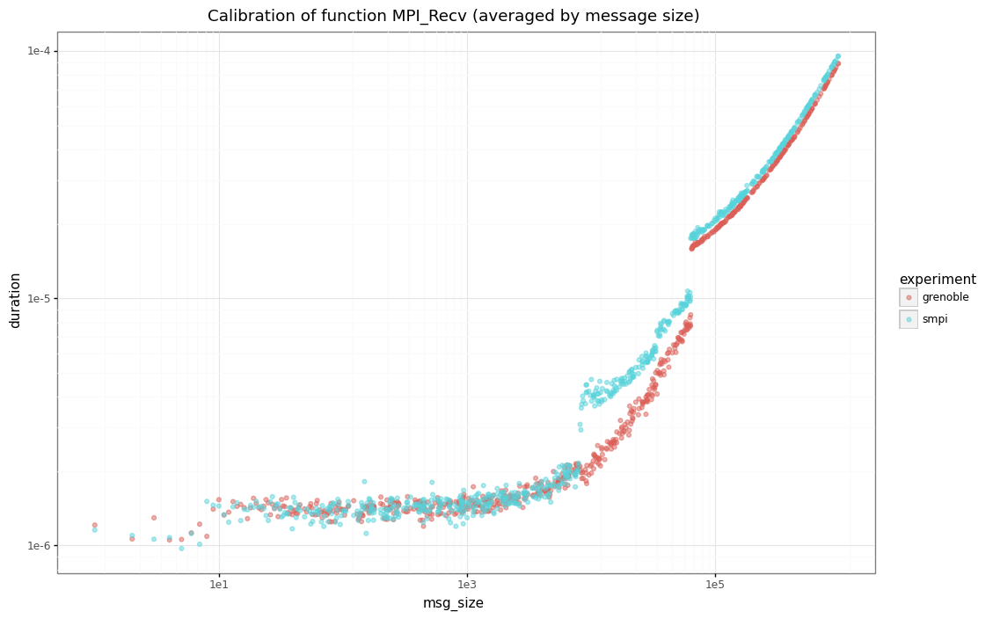

In [101]:
tmp = pandas.concat([df_recv, df_smpi_recv])
plot_compare(tmp)

#### MPI_Ping-Pong

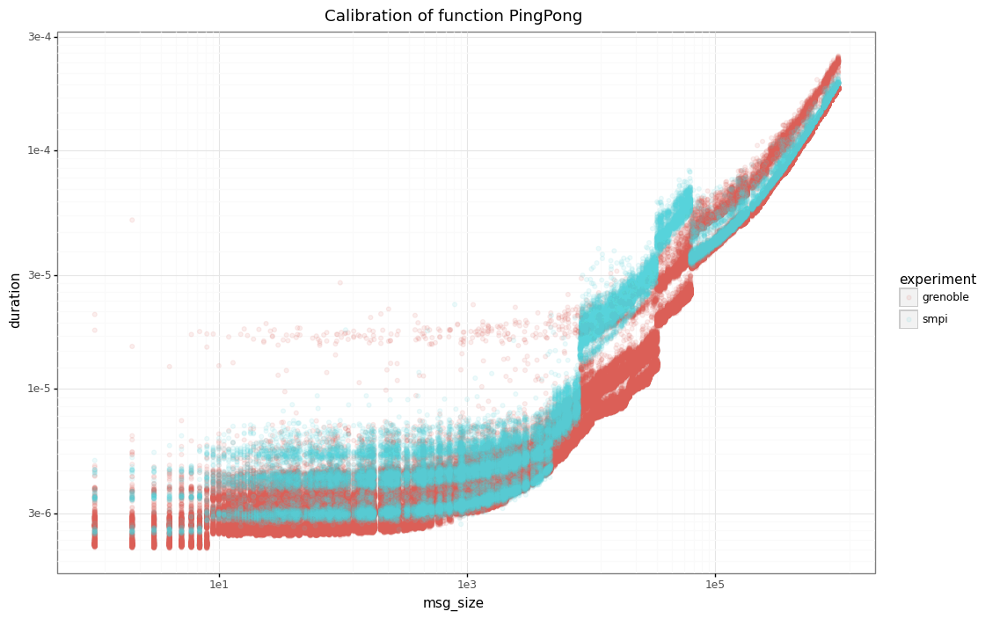

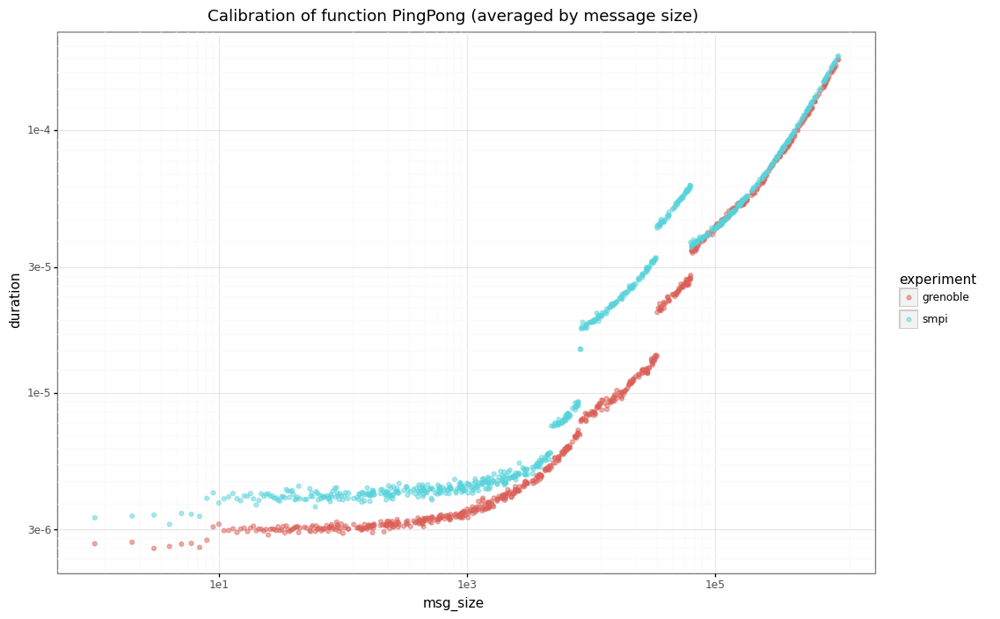

In [102]:
tmp = pandas.concat([df_pingpong, df_smpi_pingpong])
plot_compare(tmp)

#### Overall

/usr/local/lib/python3.9/dist-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 12 x 8 in image.
/usr/local/lib/python3.9/dist-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: plot_op_simgrid_dhist.png


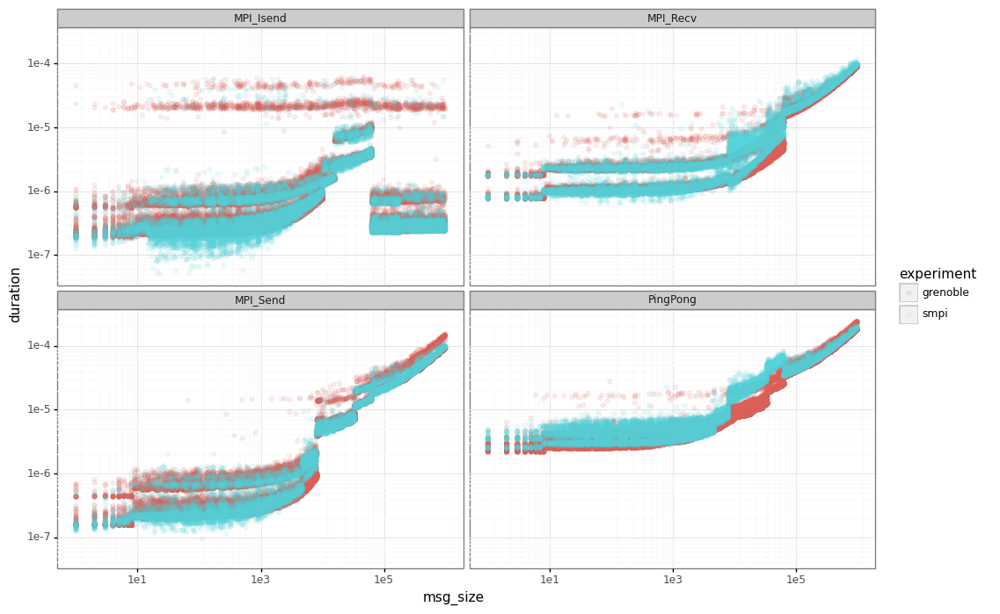

In [103]:
N = 100000
tmp = pandas.concat([df_send.sample(N), df_smpi_send, df_isend.sample(N), df_smpi_isend, df_recv.sample(N), df_smpi_recv, df_pingpong.sample(N), df_smpi_pingpong])

plot = ggplot(tmp, aes(x='msg_size', y='duration', color='experiment')) + geom_point(alpha=0.1) + scale_x_log10() + scale_y_log10() + facet_wrap('~op') + theme_bw()
plot.save('plot_op_simgrid_dhist.png')
print(plot)